Imports

In [1]:
import sys
import os

repo_root = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/"
if repo_root not in sys.path:
    sys.path.insert(0, repo_root)

import psp

/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML


In [ ]:
# Reload the package
import sys
# Remove the main package if it's in sys.modules
if 'psp' in sys.modules:
    del sys.modules['psp']

# Remove any submodules of psp
for mod in list(sys.modules.keys()):
    if mod.startswith('psp.'):
        del sys.modules[mod]
import psp

## Initial data quality control and cleaning

Reading 10x matrix data...
... reading from cache file cache/tscc-projects-ps-malilab-ydoctor-KOLF_Perturbation_Atlas-KOLF_Perturbation_Atlas_Analysis-input_files-anndata_objects-filtered_matrix_mex-matrix.h5ad


/tscc/nfs/home/ydoctor/.local/lib/python3.11/site-packages/scanpy/readwrite.py:560: UserWarning: Suffix used (-[0-9]+) to deduplicate index values may make index values difficult to interpret. There values with a similar suffixes in the index. Consider using a different delimiter by passing `join={delimiter}`Example key collisions generated by the make_index_unique algorithm: ['SPATA13-1', 'SPATA13-2', 'SPATA13-3', 'MKKS-1', 'MKKS-2']


Number of cells detected: 5386783
Unique gRNA perturbed genes detected: 11691
Average gRNA detected per gene: 3.00
Total GEX UMIs: 36,899,684,352.0
Total CRISPR UMIs: 193,396,656.0
Total cells detected: 5386783
Total genes detected: 38606
Total gRNAs detected: 35989
Total NTC gRNAs detected: 947
Average GEX UMIs per cell: 6,850.04
Average CRISPR UMIs per cell: 35.90
Assigning protospacers...


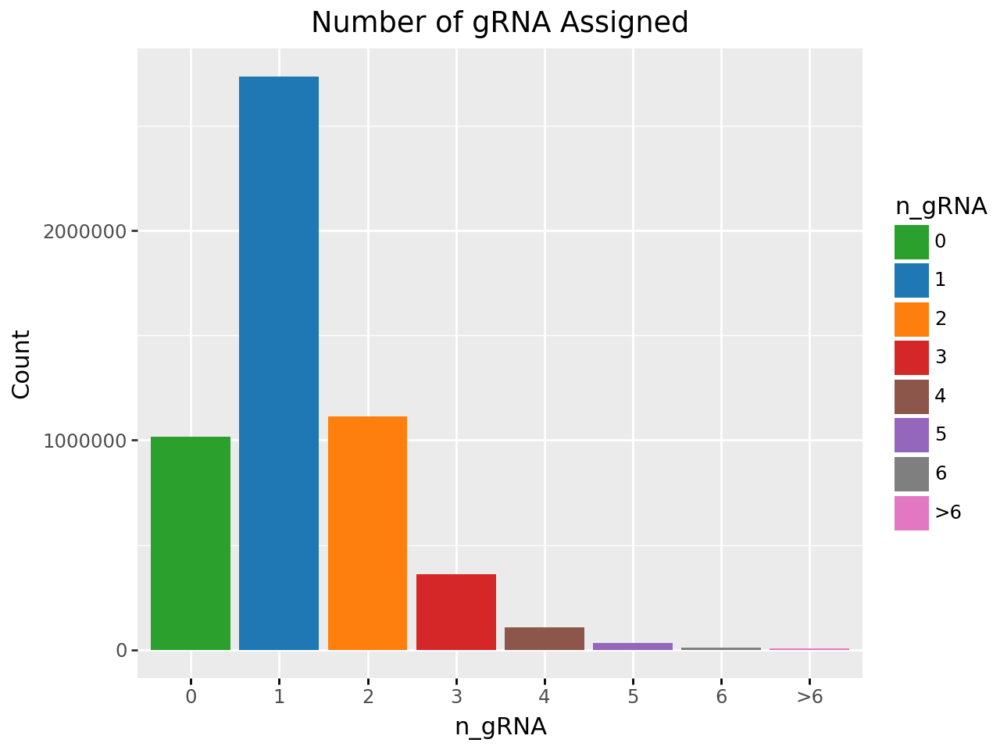

Cells without confident sgRNA calls: 18.89%
Estimated Multiplet Rate: 30.33%


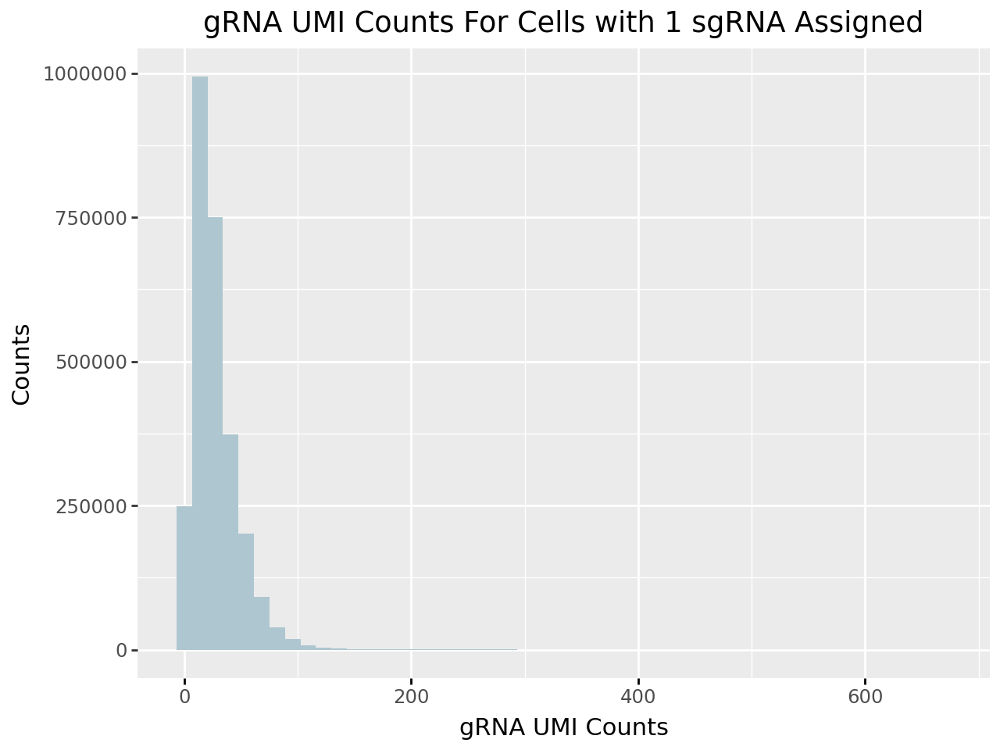

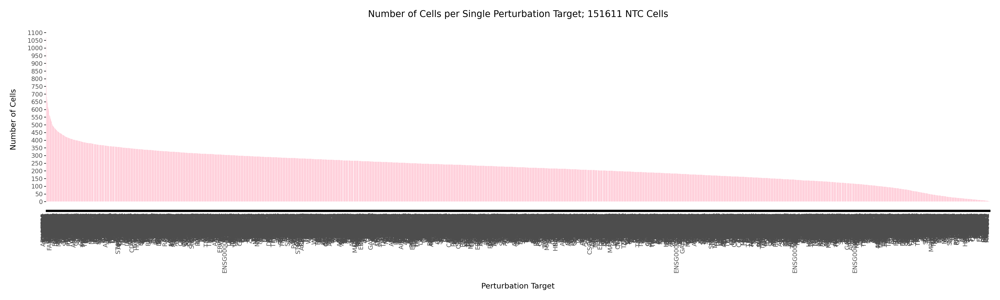

Number of perturbations with >= 50 cells with single guide assigned: 10933/11687 (93.55%)
Creating channel dictionary...
Assigning metadata...


/tmp/ipykernel_2354447/2550475819.py:33: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


Removing perturbations present in multiple batches...
Number of genes present in multiple batches: 30
(['AGAP4', 'AK6', 'AZI2', 'BORCS8', 'CCDC74A', 'CCZ1', 'CENPVL1', 'CKMT1A', 'CPNE1', 'CTAGE15', 'CTAGE4', 'ERV3-1', 'F8A1', 'FAM72B', 'HAUS3', 'KAT14', 'KIAA1586', 'KYAT3', 'NPIPA8', 'NPIPB13', 'PCDHB13', 'PITPNM1', 'PURB', 'RABL2B', 'SLX1A', 'SMN1', 'TCEAL2', 'TIMM23', 'TRAPPC2B', 'ZBED6'])
Selecting the batch with the most sgRNAs per gene
Saving pre-QC data to /tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Pre_QC.h5ad...
Performing general QC...
normalizing counts per cell
    finished (0:03:00)


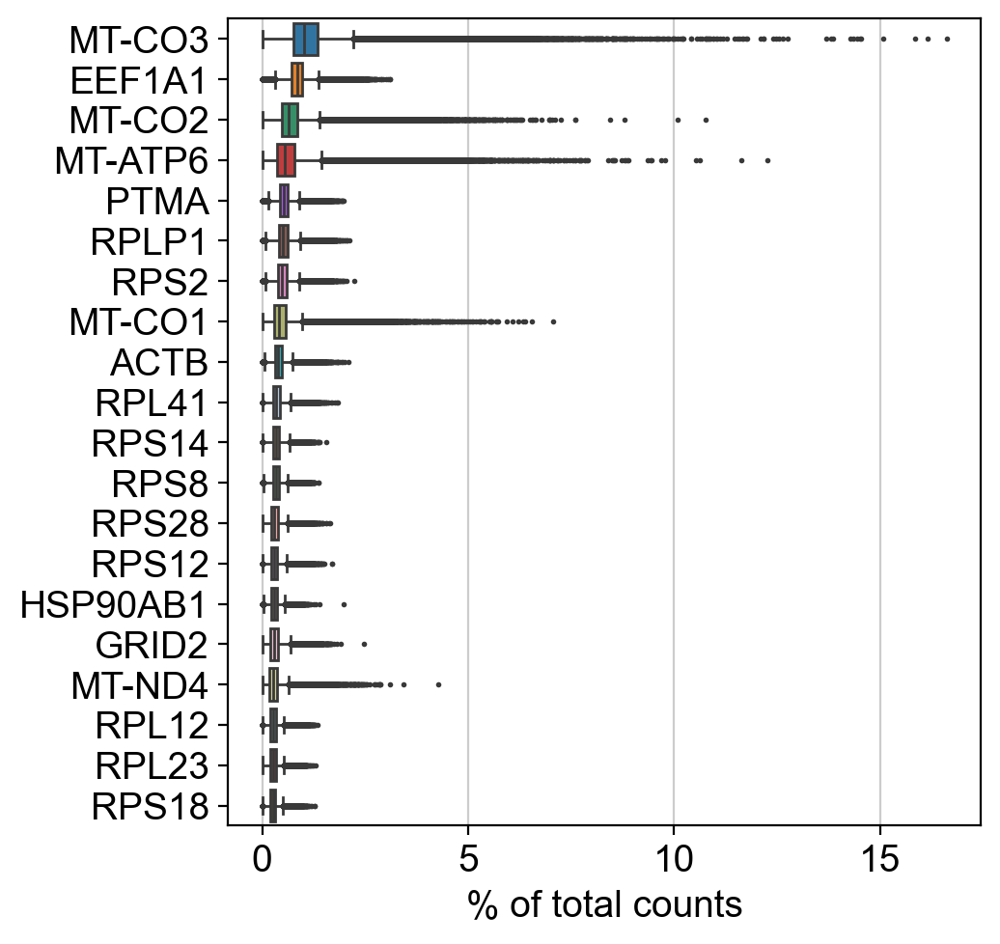

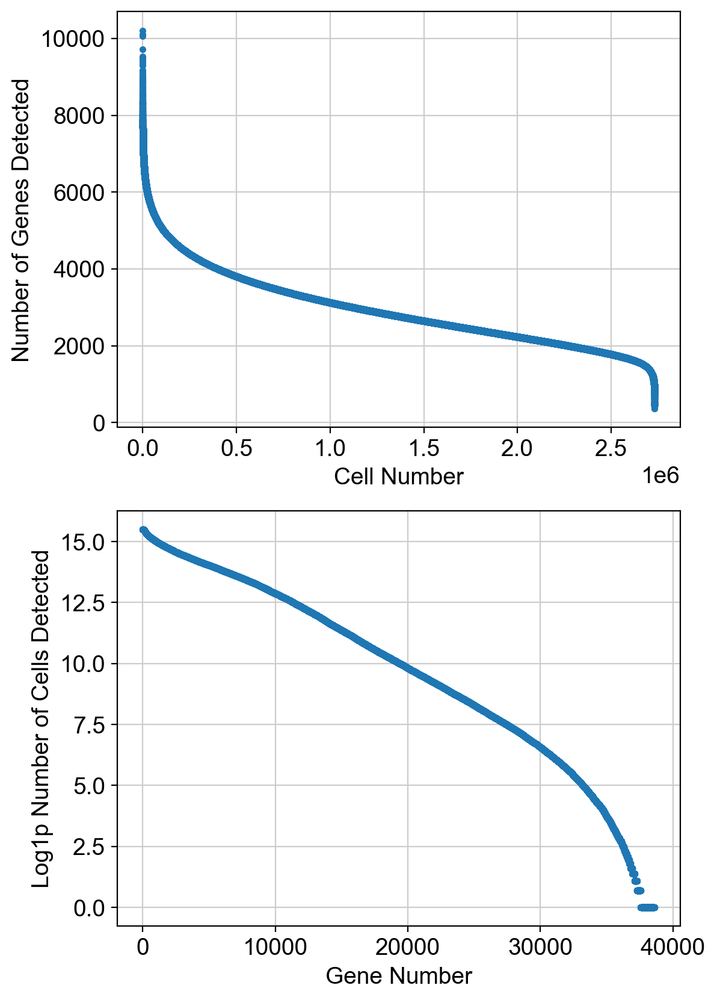

Removing 1039 genes not detected in any cells.
Performing dead cell QC...


/tmp/ipykernel_2354447/2550475819.py:33: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


outlier
False    2659209
True       71798
Name: count, dtype: int64

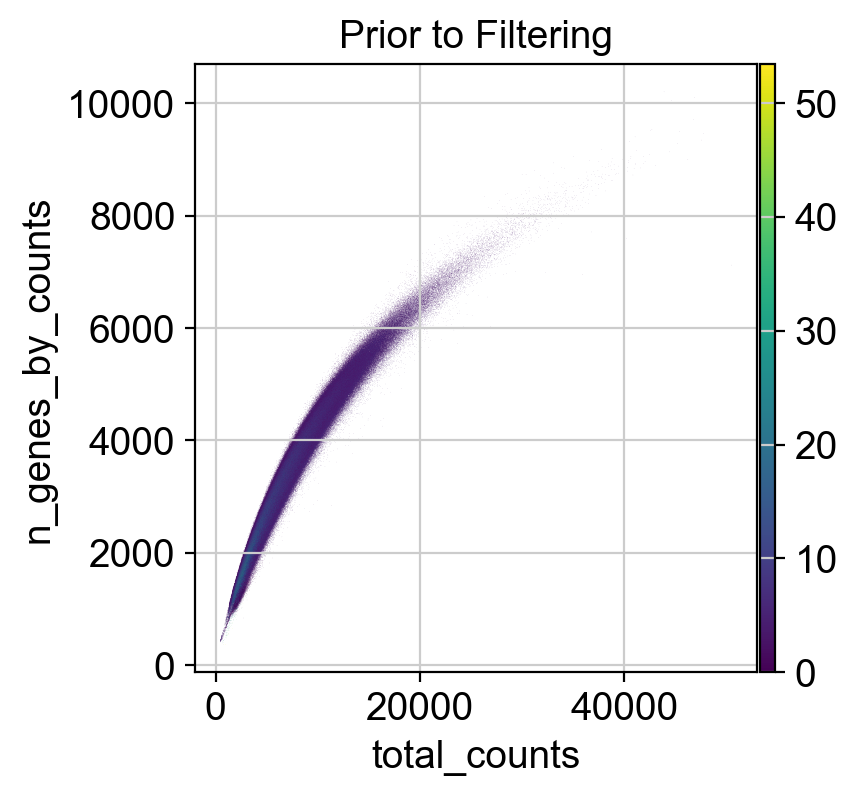

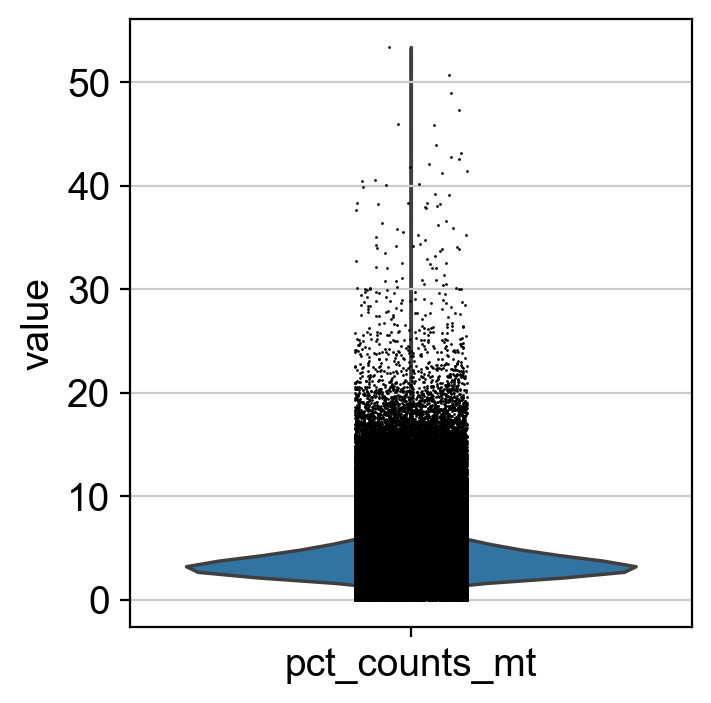

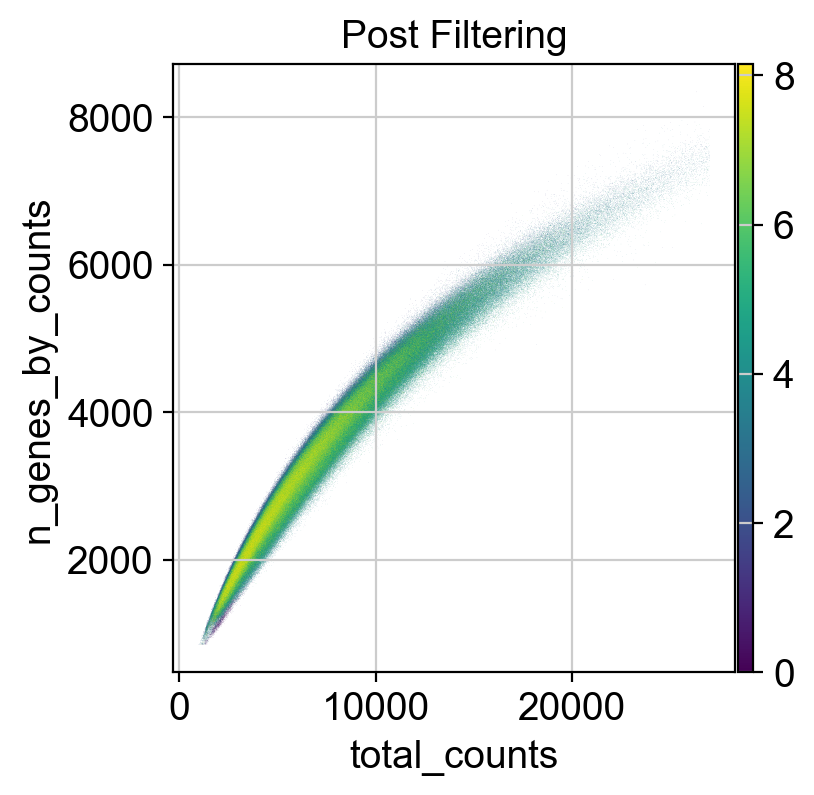

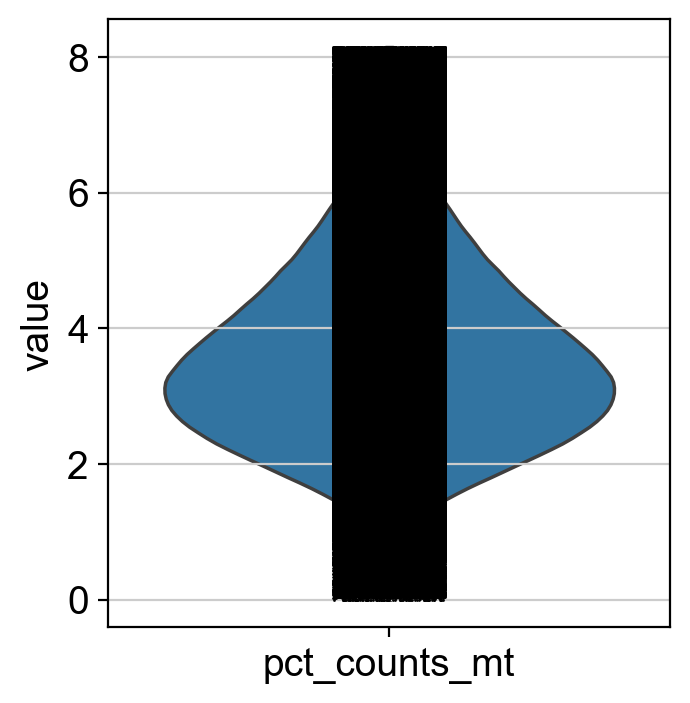

Performing doublet detection sanity check...


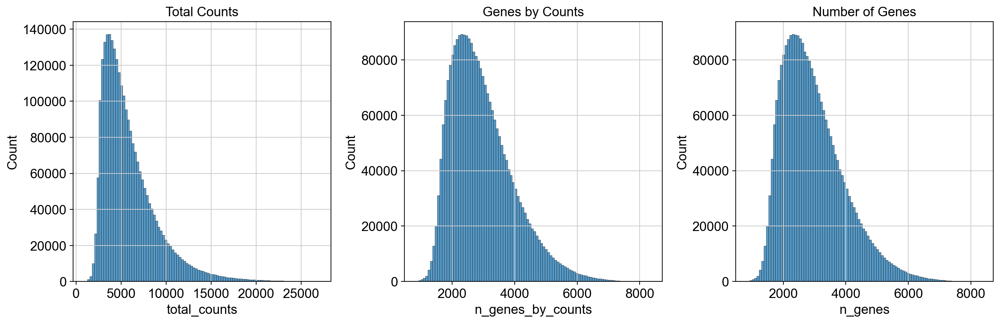

Saving final QC file to /tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_QC_Filtered.h5ad...


In [ ]:
mtx_dir = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/filtered_matrix_mex"
save_directory = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Aggregate.h5mu"
protospacer_calls_file = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/protospacer_calls_per_cell.csv"
aggregation_csv = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/aggregation_csv.csv"
cell_type = "KRAB-ZIM3-dCas9 KOLF2.1J hiPSC"
perturbation_type = "CRISPRi"
pre_qc_save_path = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Pre_QC.h5ad"
final_save_path = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_QC_Filtered.h5ad"
gene_id_filepath = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/gene_ids.txt"
obs_key = "gene_target_ensembl_id"
var_key = "gene_ids"
ntc_label = "NTC"
ntc_sgRNA_prefix = "Non-Targeting"
remove_batch_duplicates = True

input_dict = {
    "mtx_dir": mtx_dir,
    "save_directory": save_directory,
    "protospacer_calls_file": protospacer_calls_file,
    "aggregation_csv": aggregation_csv,
    "cell_type": cell_type,
    "perturbation_type": perturbation_type,
    "pre_qc_save_path": pre_qc_save_path,
    "final_save_path": final_save_path,
    "gene_id_filepath": gene_id_filepath,
    "obs_key": obs_key,
    "var_key": var_key,
    "ntc_label": ntc_label,
    "ntc_sgRNA_prefix": ntc_sgRNA_prefix,
    "remove_batch_duplicates": remove_batch_duplicates
}

adata = psp.qc.default_qc(input_dict)

### Scrubbing NTC Cells

Initial number of NTC Cells: 151611
Number of NTC Cells after whitelist filtering: 54986
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    343 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    258 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:23)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', t

2025-04-24 11:26:42,985 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-24 11:26:53,103 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-24 11:26:53,317 - harmonypy - INFO - Iteration 1 of 10
2025-04-24 11:27:08,175 - harmonypy - INFO - Iteration 2 of 10
2025-04-24 11:27:23,255 - harmonypy - INFO - Iteration 3 of 10
2025-04-24 11:27:38,380 - harmonypy - INFO - Iteration 4 of 10
2025-04-24 11:27:53,538 - harmonypy - INFO - Iteration 5 of 10
2025-04-24 11:28:08,710 - harmonypy - INFO - Iteration 6 of 10
2025-04-24 11:28:20,439 - harmonypy - INFO - Iteration 7 of 10
2025-04-24 11:28:29,401 - harmonypy - INFO - Iteration 8 of 10
2025-04-24 11:28:36,996 - harmonypy - INFO - Converged after 8 iterations


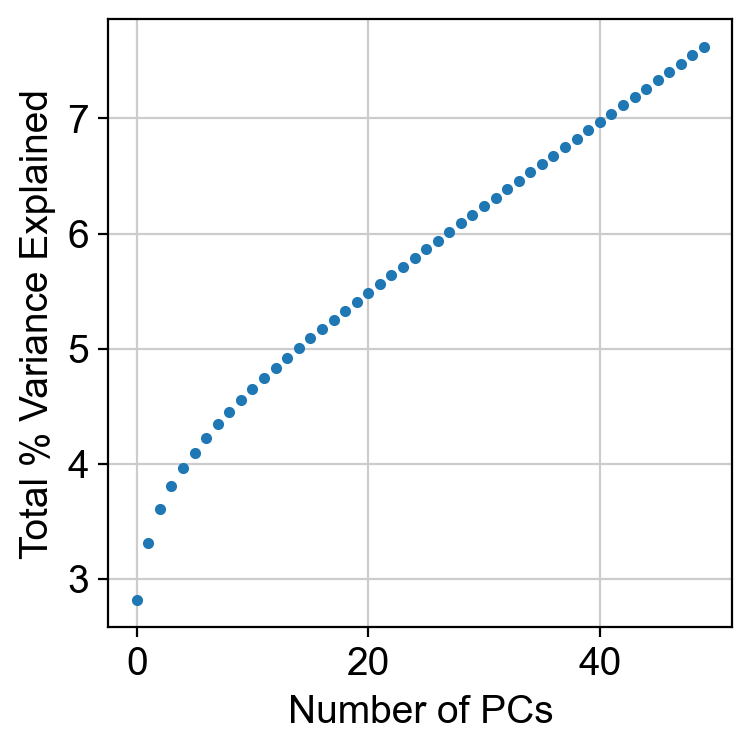

computing neighbors
    computing neighbors
    computed neighbors (0:00:07)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:33)


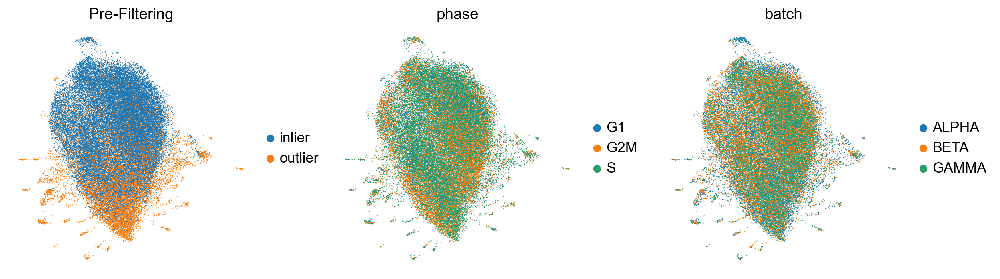

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


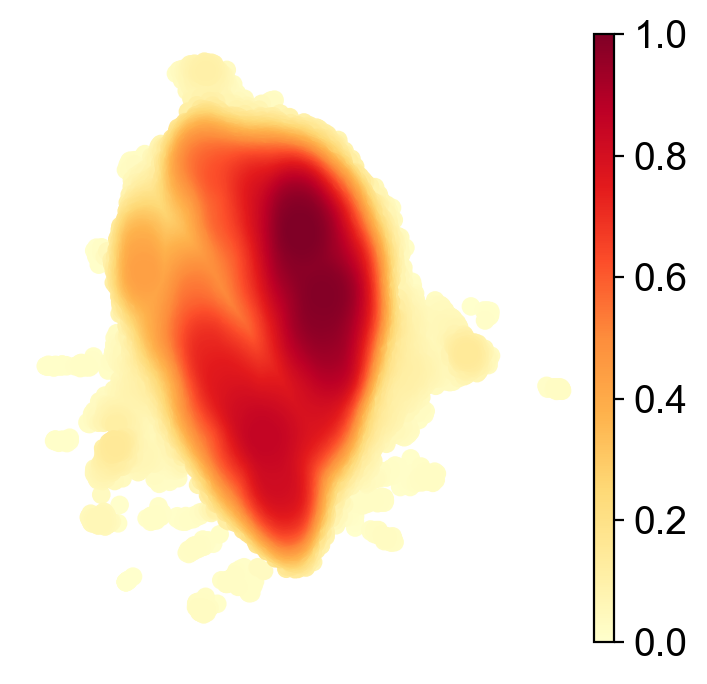

Removing 28 NTC guides due to having less than 25 cells in each batch
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    computed neighbors (0:00:04)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


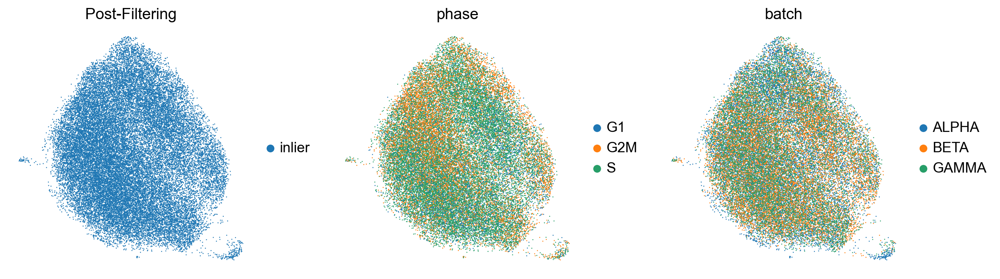

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


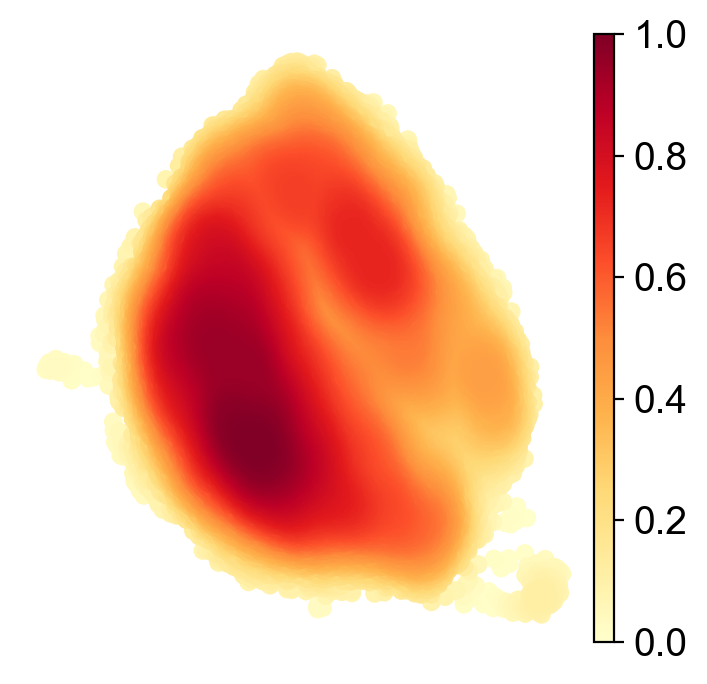

Number of NTC Cells after Isolation Forest filtering: 35424
Total number of cells after NTC cleaning: 2614820
Number of NTC Cells per batch 
: batch
ALPHA    13760
BETA     12387
GAMMA     9277
Name: count, dtype: int64


In [10]:
adata_filepath = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Pre_QC.h5ad"
NTC_whitelist_path = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/NTC_sgRNA_whitelist.txt"
adata = psp.utils.read_anndata(adata_filepath)
adata = psp.pp.clean_ntc_cells(adata, NTC_whitelist_path=NTC_whitelist_path, batch_key = 'batch')
final_save_path = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_NTC_Filtered.h5ad"
adata.write(final_save_path)

### Filtering sgRNAs that cause sufficient target gene knockdown

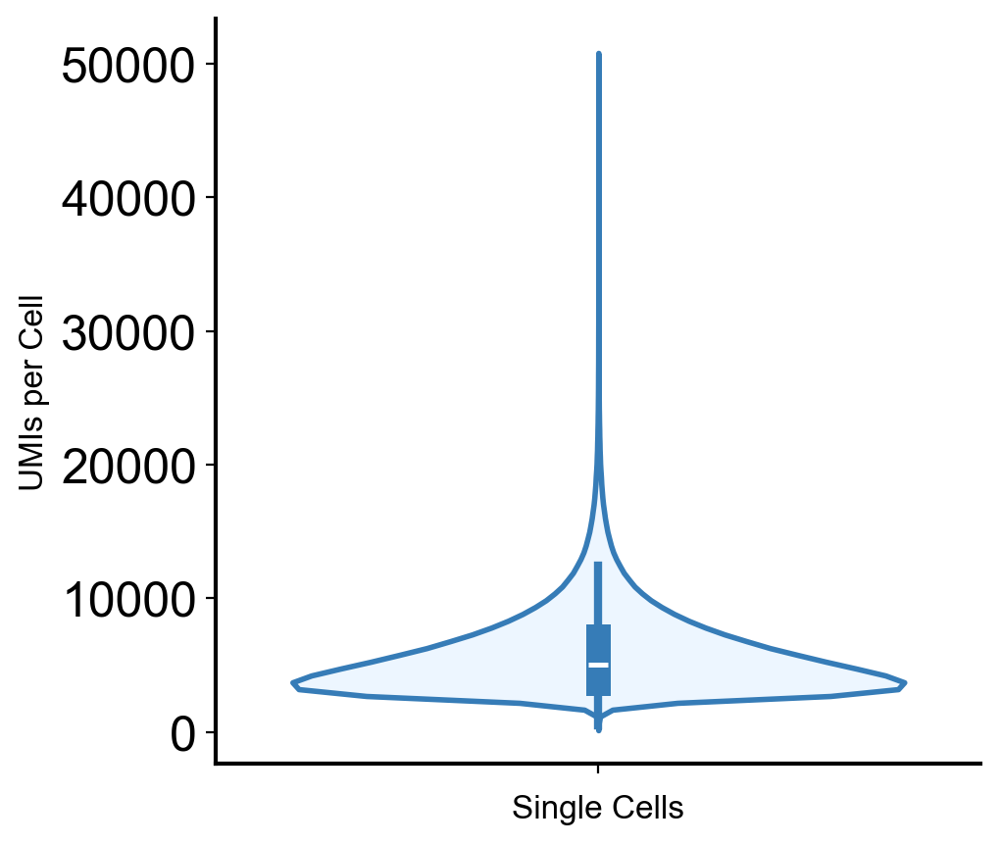

In [5]:
data_path = "/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_NTC_Filtered.h5ad"
adata = psp.utils.read_anndata(data_path)
fig = psp.pl.plot_umis_per_cell(adata)
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/umis_per_cell.png")
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/umis_per_cell.svg")
adata = psp.pp.knockdown_qc(adata)
adata.write("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Evaluated.h5ad")

In [42]:
import anndata as ad
adata = ad.read_h5ad('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Evaluated.h5ad')

30379/34718 (87.50%) have > 25 cells


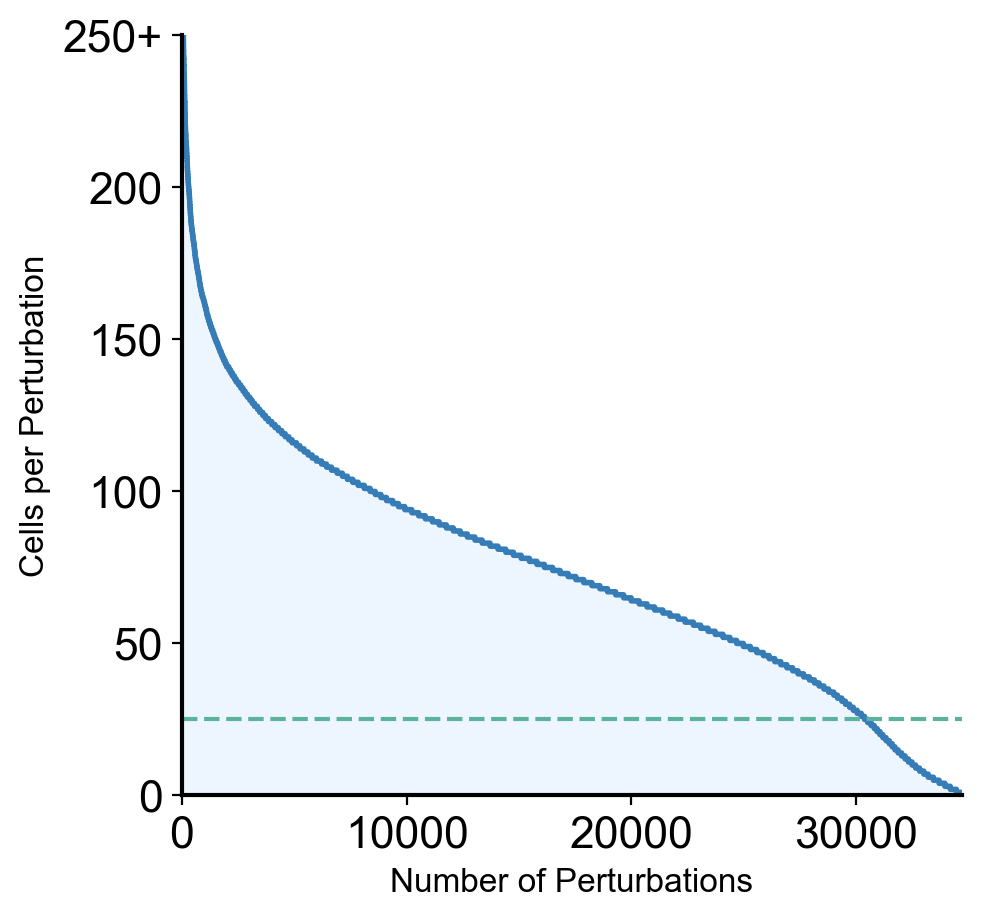

10309/11687 (88.21%) have > 100 cells


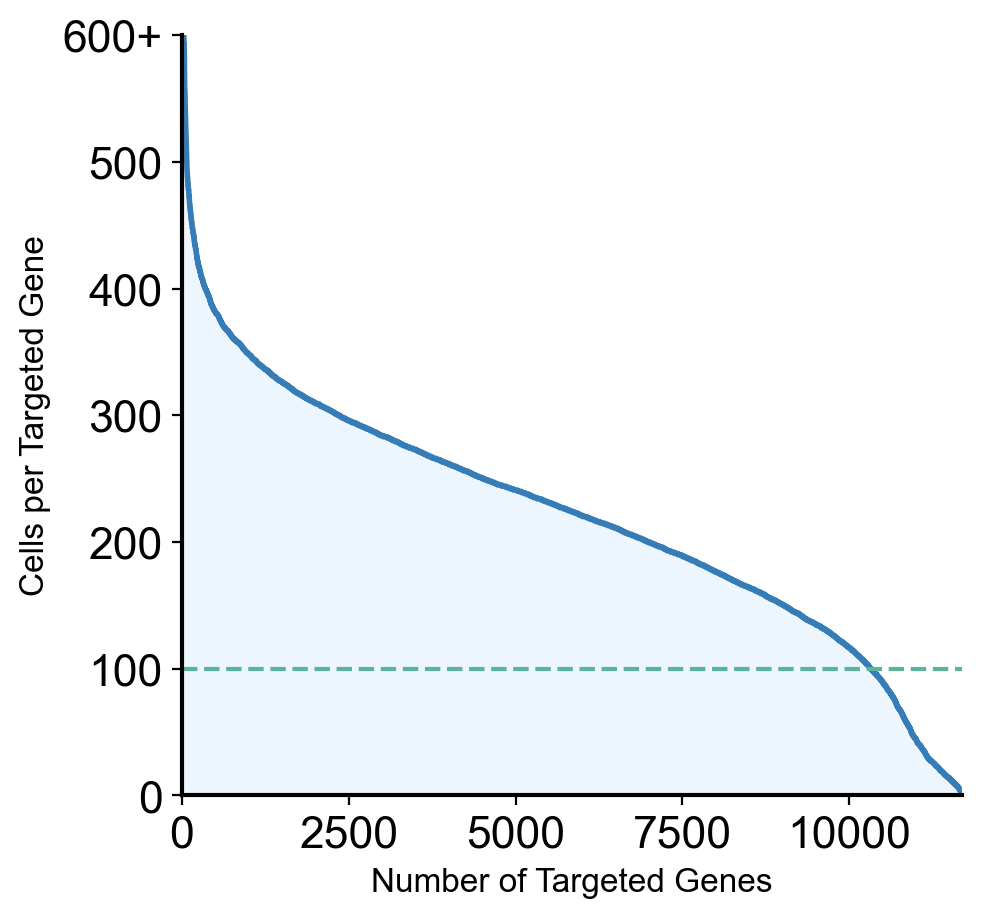

Percentage of perturbations achieving 30.0% repression: 80.11% (27814/34718)
Percentage of perturbations achieving 30.0% repression: 81.31% (9503/11687)


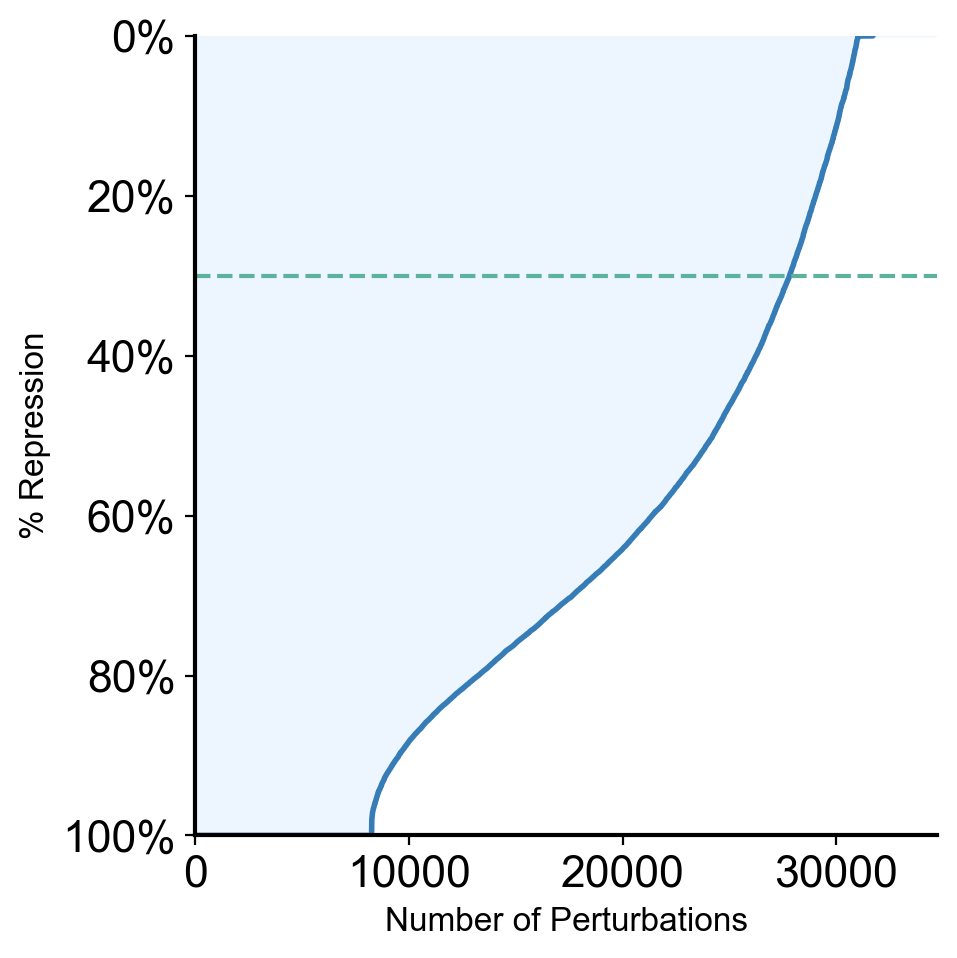

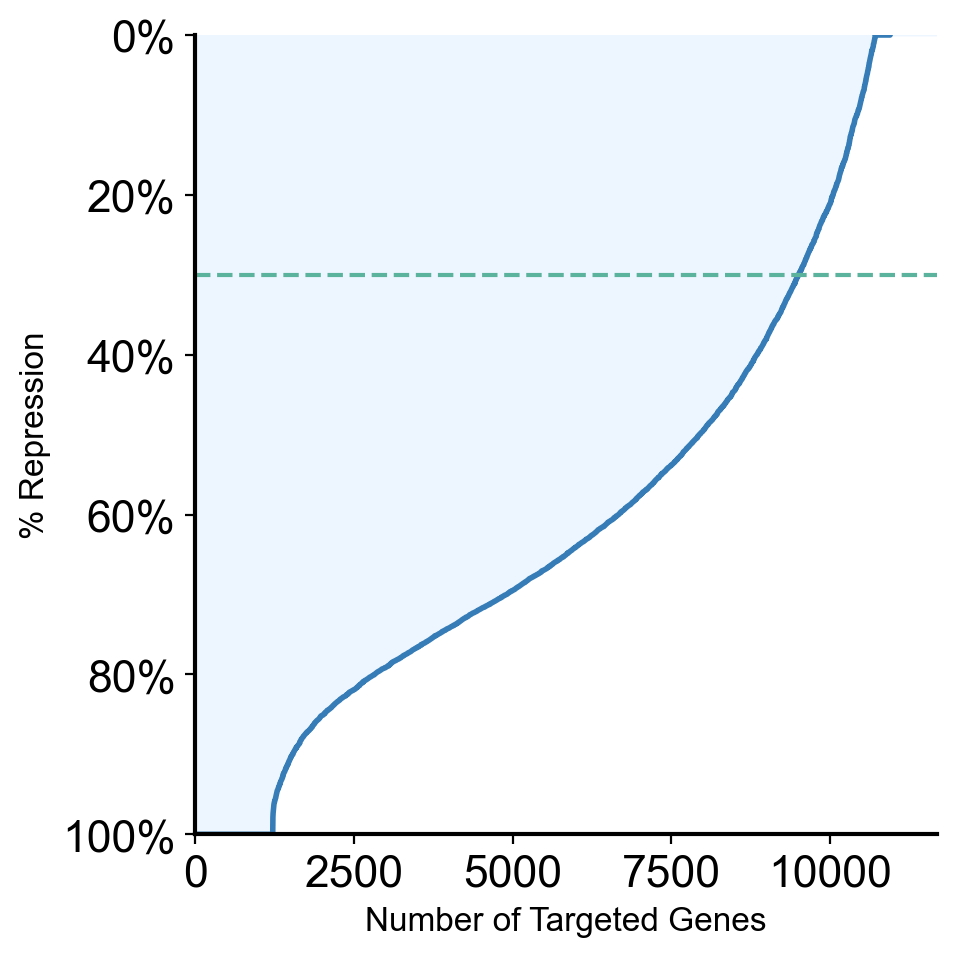

In [43]:
fig = psp.pl.plot_cells_per_perturbation(adata, perturbation_key = 'perturbation', xlabel='Number of Perturbations', ylabel='Cells per Perturbation', highlight_threshold=25, y_max=250, tick_spacing=50)
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/cells_per_perturbation.png",dpi=1200)
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/cells_per_perturbation.svg")

fig = psp.pl.plot_cells_per_perturbation(adata, perturbation_key = 'gene_target', xlabel='Number of Targeted Genes', ylabel='Cells per Targeted Gene')
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/cells_per_gene_target.png",dpi=1200)
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/cells_per_gene_target.svg")

fig2 = psp.pl.plot_percentage_perturbations_by_repression(adata, perturbation_col='perturbation', xlabel='Number of Perturbations')
fig2.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/sgRNA_knockdown.png",dpi=1200)
fig2.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/sgRNA_knockdown.svg")

fig2 = psp.pl.plot_percentage_perturbations_by_repression(adata, perturbation_col='gene_target', xlabel='Number of Targeted Genes')
fig2.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/gene_knockdown.png",dpi=1200)
fig2.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/gene_knockdown.svg")

Processing batch: ALPHA
Processing batch: BETA
Processing batch: GAMMA
Removing 6904 guides due to low repression (less than 30.0%)
Removing 114469 cells due to no repression (Target knockdown < 0)
Removing 3159 guides due to low cell count per guide (less than 25 cells per guide)


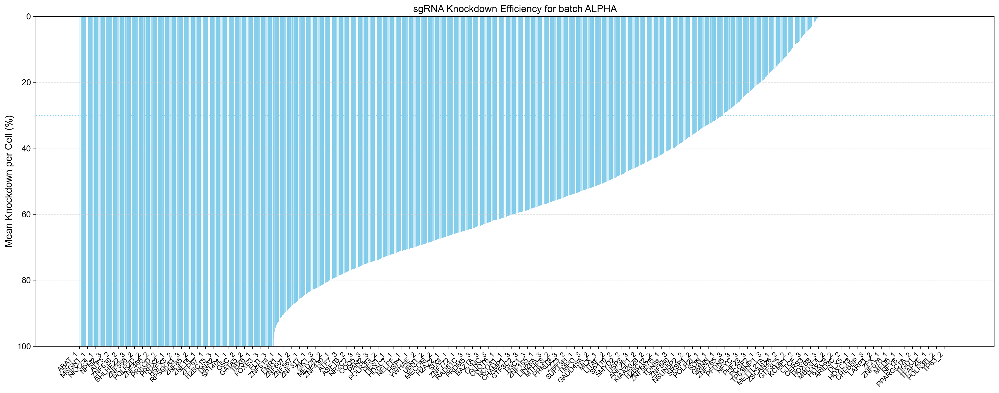

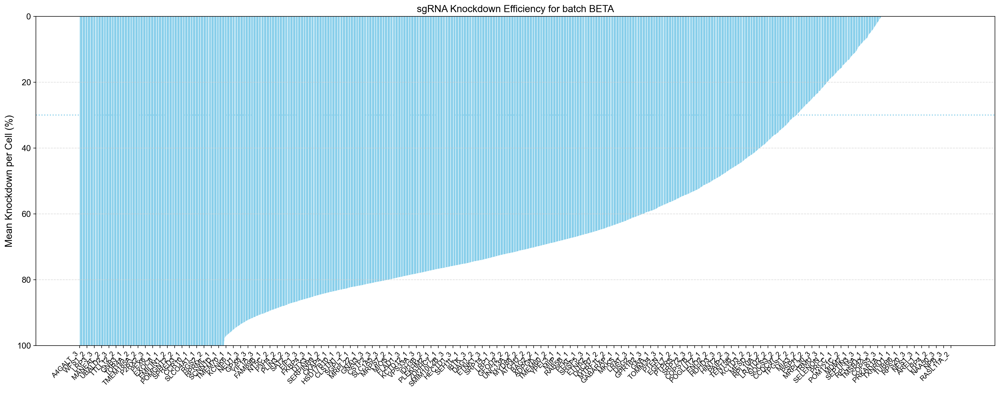

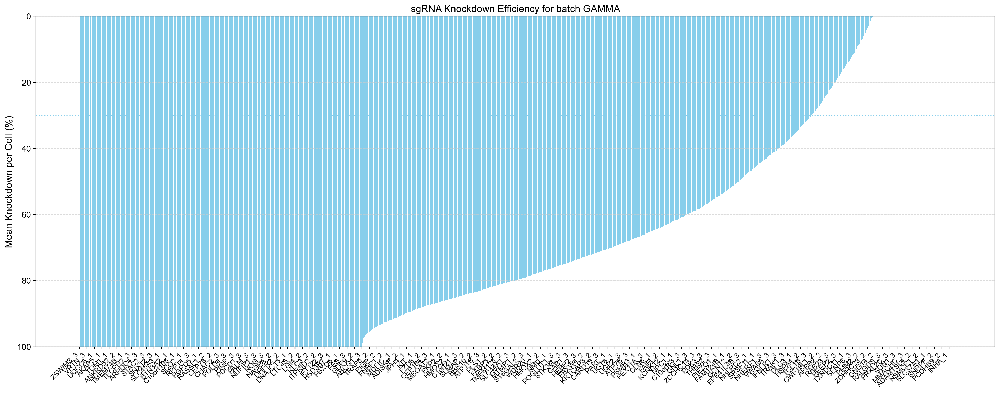

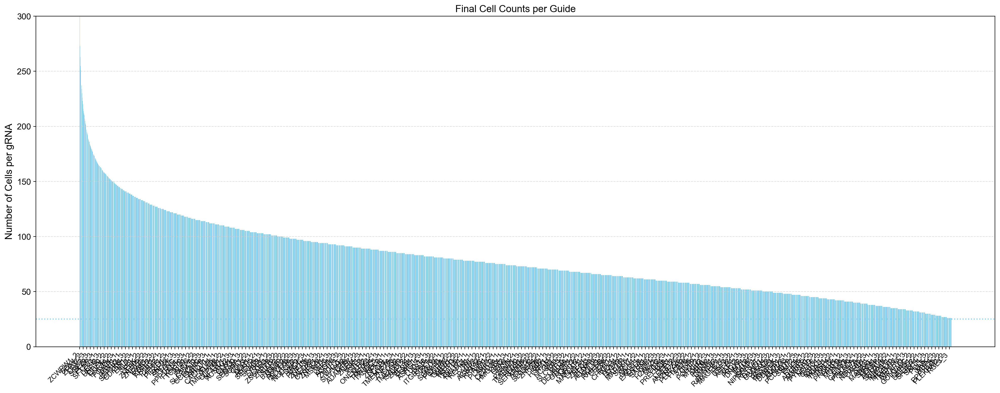

In [13]:
adata = psp.pp.evaluate_per_sgRNA_knockdown(adata)
adata.write("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Filtered.h5ad")

In [14]:
# Final statistics
print(f"Total number of cells: {adata.n_obs}")
print(f"Total number of NTC sgRNAs: {psp.utils.get_ntc_view(adata).obs.gRNA.nunique()}")
print(f"Total number of NTC cells: {psp.utils.get_ntc_view(adata).n_obs}")
print(f"Total number of perturbations: {psp.utils.get_perturbed_view(adata).obs.gRNA.nunique()}")
print(f"Total number of genes targeted: {psp.utils.get_perturbed_view(adata).obs.gene_target.nunique()}")
print(f"Median number of cells per perturbation: {psp.utils.get_perturbed_view(adata).obs.perturbation.value_counts().median()}")
print(f"Median number of cells per gene_target: {psp.utils.get_perturbed_view(adata).obs.gene_target.value_counts().median()}")

Total number of cells: 1977854
Total number of NTC sgRNAs: 208
Total number of NTC cells: 35424
Total number of perturbations: 24655
Total number of genes targeted: 10167
Median number of cells per perturbation: 74.0
Median number of cells per gene_target: 186.0


In [3]:
adata = psp.utils.read_anndata("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Filtered.h5ad")

### Filtering sgRNAs by Energy Distance

In [ ]:
### This code was run on the cluster as a batch job owing to the total runtime of 1-10:14:05 
adata = psp.utils.read_anndata("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Filtered.h5ad")
estats = psp.da.compute_etest(adata)
estats.to_csv("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/etest_results.csv")
adata.write("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Energy_Test_Computed.h5ad")

/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10


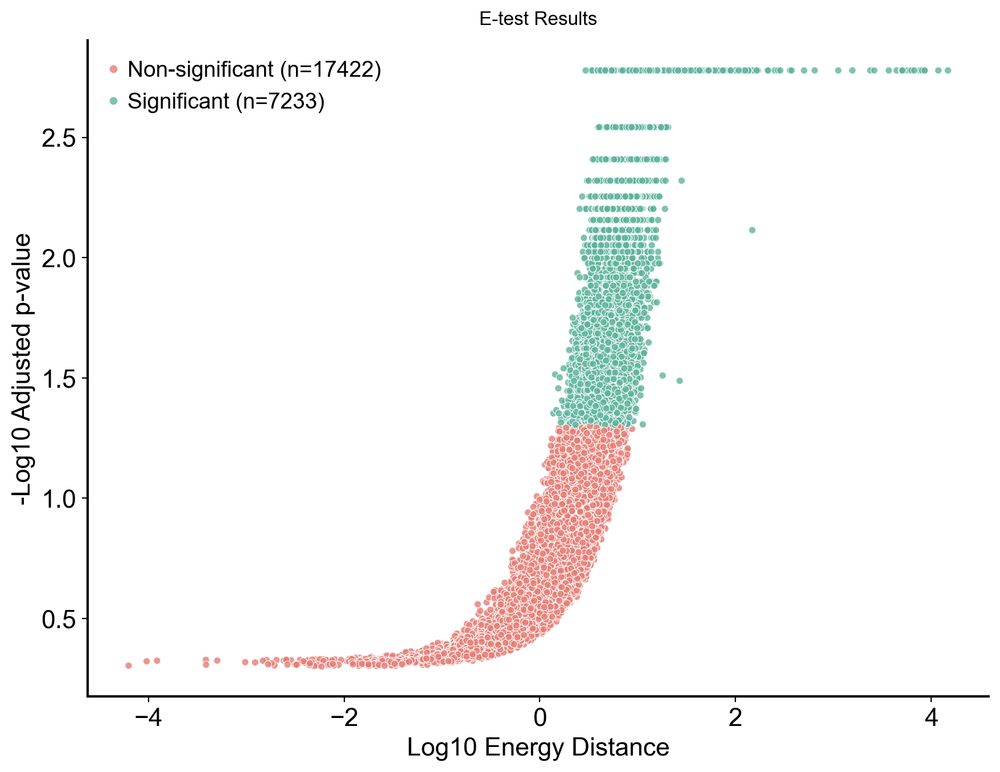

In [16]:
import pandas as pd
estats = pd.read_csv("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/etest_results.csv", index_col=0)
estats['gene'] = estats.index.to_series().str.rsplit('_', n=1).str[0]
fig = psp.pl.plot_etest_results(estats)
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_etest_results.svg")
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_etest_results.png")

/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3579: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3579: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3579: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3579: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3579: ConstantI


Concordance between max repression and max energy distance:
  • 3357/8754 genes (38.3%) have the same sgRNA showing maximum repression and maximum energy distance
  • Average Pearson correlation between repression and energy distance: -0.006
  • Median Pearson correlation: 0.019
  • Found valid correlations for 1437/8754 genes


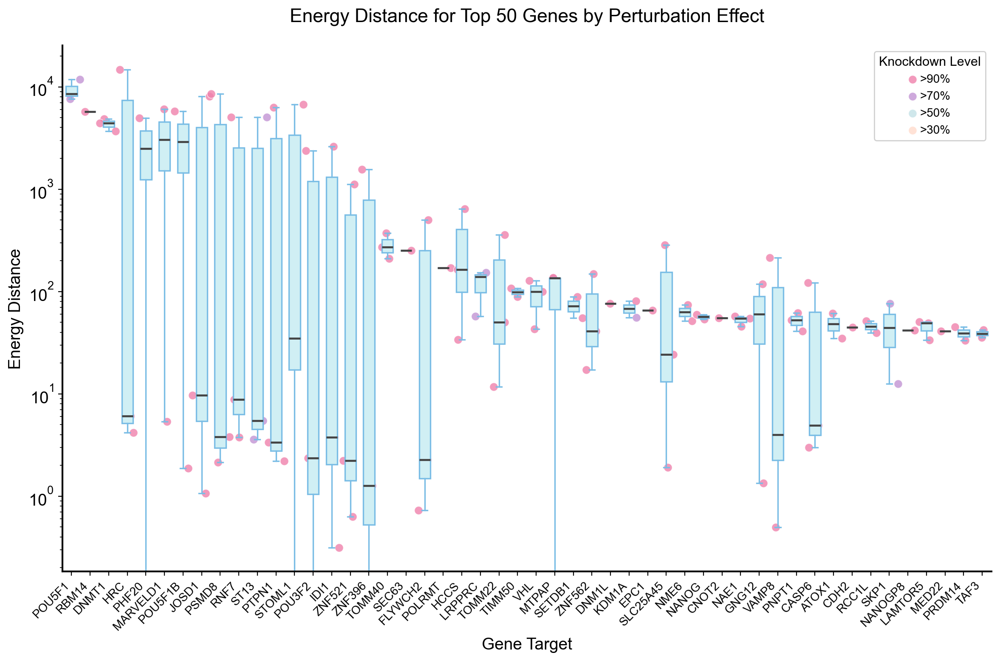

In [17]:
adata = psp.utils.read_anndata("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Energy_Test_Computed.h5ad")
fig = psp.pl.plot_energy_distance_vs_knockdown(adata, log_scale=True, n_genes=50)
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Distance_vs_Knockdown.svg")

### Investigating DEGs

In [ ]:
# This code was run on the cluster as a batch job owing to the total runtime of 3 days
adata = psp.utils.read_anndata("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Energy_Test_Computed.h5ad")
res = psp.de.differential_expression_from_files(adata,pseudo_bulk_dir='/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/precomputed_psuedobulks',adata_deg_test_column='perturbation', ntc_cells_delimiter='NTC', batch_key='batch', alpha=0.05, save_path='/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_DEG_per_perturbation.xlsx', plot_degs=True, fig_save_path='/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_DEGs_per_perturbation.svg')
adata.write("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Energy_Test_DEGs_Computed.h5ad")

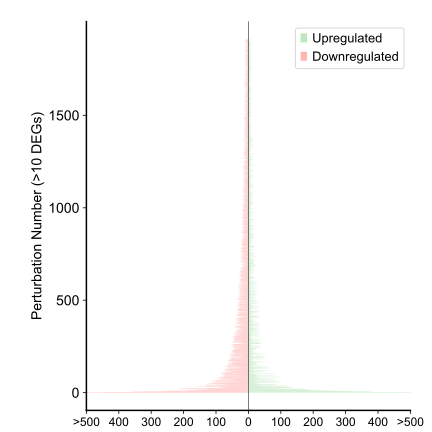

In [1]:
from IPython.display import SVG
with open('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_DEGs_per_perturbation.svg', 'r') as f:
    svg_content = f.read()
display(SVG(svg_content))


2025-05-30 14:19:38 - INFO - Using 35424 non-targeting control cells for benchmarking
2025-05-30 14:19:38 - INFO - Found 208 unique NTC sgRNAs
2025-05-30 14:19:38 - INFO - Performing batch-aware analysis using batch key: batch
2025-05-30 14:19:38 - INFO - Found 3 unique batches


Benchmarking NTC sgRNAs (batch-aware):   0%|          | 0/208 [00:00<?, ?it/s]

/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/psp/de/differential_expression.py:913: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/psp/de/differential_expression.py:913: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/psp/de/differential_expression.py:913: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/psp/de/differential_expression.py:913: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/psp/de/differential_expression.py:913: UserWarning: The dispersion trend curve fitting did not converge. Switching

2025-05-30 16:01:52 - INFO - Stored NTC FDR threshold (1) in adata.uns['ntc_fdr_threshold']
2025-05-30 16:01:52 - INFO - NTC Benchmark Statistics:
2025-05-30 16:01:52 - INFO -   • FDR 0.05 threshold: 1 DEGs
2025-05-30 16:01:52 - INFO -   • NTC comparisons analyzed: 624
2025-05-30 16:01:52 - INFO -   • Mean DEGs per comparison: 0.2
2025-05-30 16:01:52 - INFO -   • Median DEGs per comparison: 0.0
2025-05-30 16:01:52 - INFO -   • 95% of comparisons have < 1 DEGs


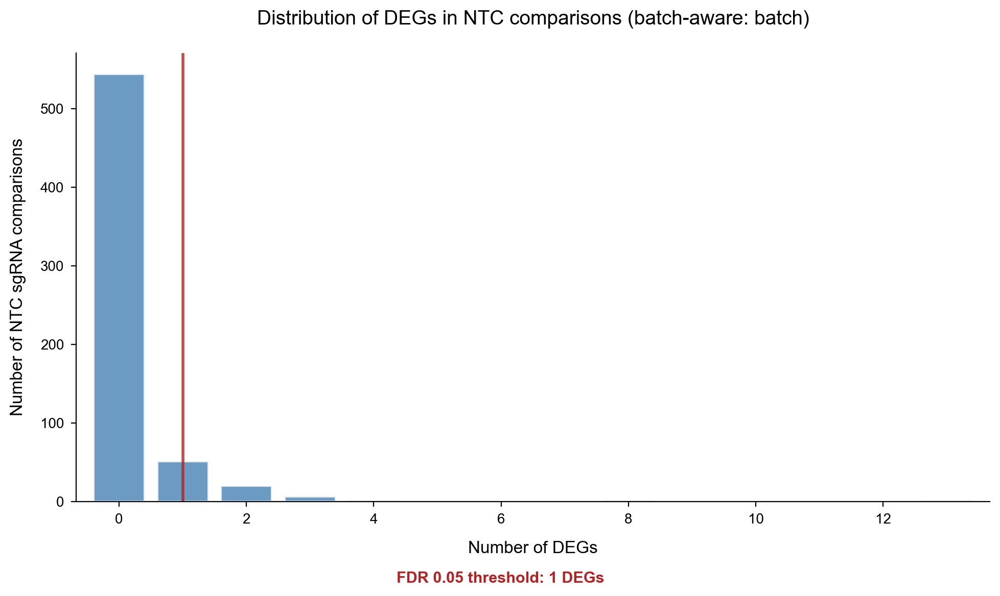

2025-05-30 16:01:53 - INFO - Saved benchmark figure to /tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_NTC_DEG_per_perturbation.svg
2025-05-30 16:01:53 - INFO - Saved benchmark results to /tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_NTC_DEG_per_perturbation.csv
2025-05-30 16:01:53 - INFO - Using n_DEGs_perturbation for FDR significance
2025-05-30 16:01:53 - INFO - Batch ALPHA FDR threshold: 1 DEGs
2025-05-30 16:01:53 - INFO - Batch BETA FDR threshold: 2 DEGs
2025-05-30 16:01:53 - INFO - Batch GAMMA FDR threshold: 1 DEGs
2025-05-30 16:01:53 - INFO - Added FDR significance column to adata.obs['exceeds_ntc_fdr']
2025-05-30 16:01:54 - INFO - Perturbations exceeding NTC FDR threshold: 5441/24655 (22.1%)


In [5]:
adata = psp.utils.read_anndata("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Energy_Test_DEGs_Computed.h5ad")
res = psp.de.benchmark_NTC_FDR(adata, batch_key='batch', save_path='/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_NTC_DEG_per_perturbation.csv', fig_save_path='/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_NTC_DEG_per_perturbation.svg')


In [7]:
adata.write("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Energy_Test_DEGs_Computed_NTC_FDR_Computed.h5ad")

In [5]:
import anndata as ad
adata = ad.read_h5ad("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Energy_Test_DEGs_Computed_NTC_FDR_Computed.h5ad")

Plot statistics:
  • Total perturbations: 24656
  • Perturbations with any significance: 39.1%
  • Perturbations significant in both metrics: 12.3%


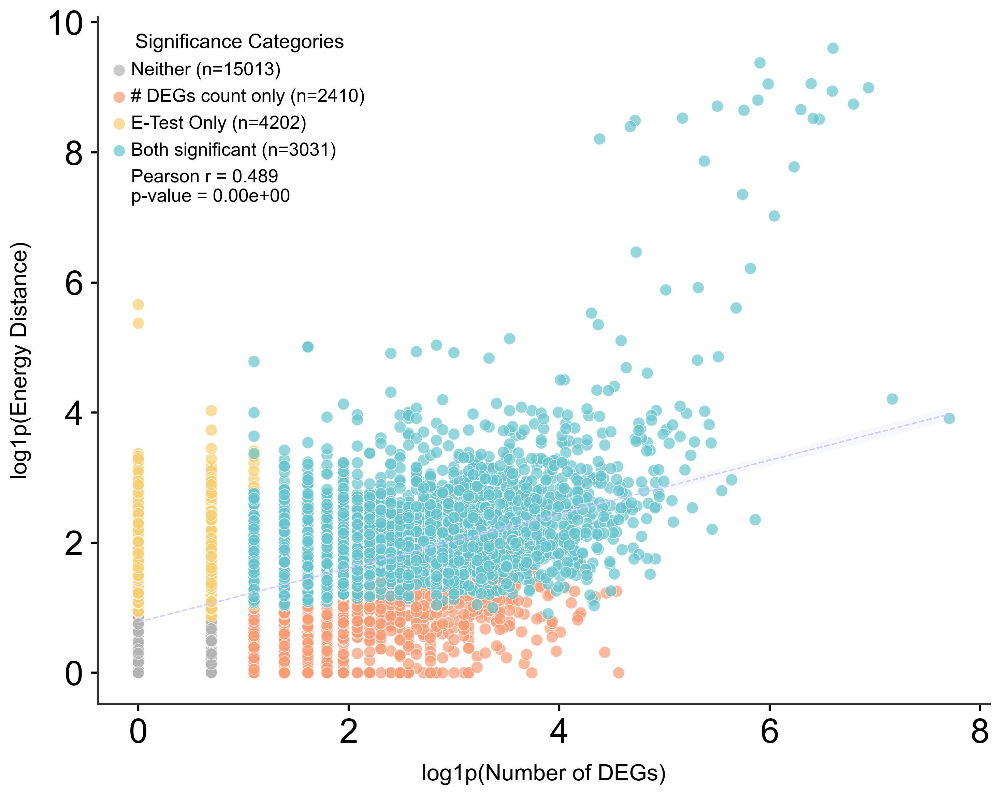

In [9]:
fig = psp.pl.plot_edist_vs_degs(adata)
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Distance_vs_DEGs.svg")
fig.savefig("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Distance_vs_DEGs.png", dpi=1200)

In [24]:
def filter_to_significant_perturbations(adata, etest_sig_column = 'perturbation_cross_batch_significant', deg_sig_column = 'exceeds_ntc_fdr', NTC_column = 'perturbed'):
    etest_sig_cells = adata.obs[etest_sig_column] == True
    deg_sig_cells = adata.obs[deg_sig_column] == True
    sig_cells = etest_sig_cells & deg_sig_cells
    NTCs = adata.obs[NTC_column] == "False"
    valid_cells = sig_cells | NTCs
    return adata[valid_cells].copy()

filtered_adata = filter_to_significant_perturbations(adata)
filtered_adata.write('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Energy_Test_DEGs_FDR_Filtered.h5ad')

Plot statistics:
  • Total perturbations: 3032
  • Perturbations with any significance: 100.0%
  • Perturbations significant in both metrics: 100.0%


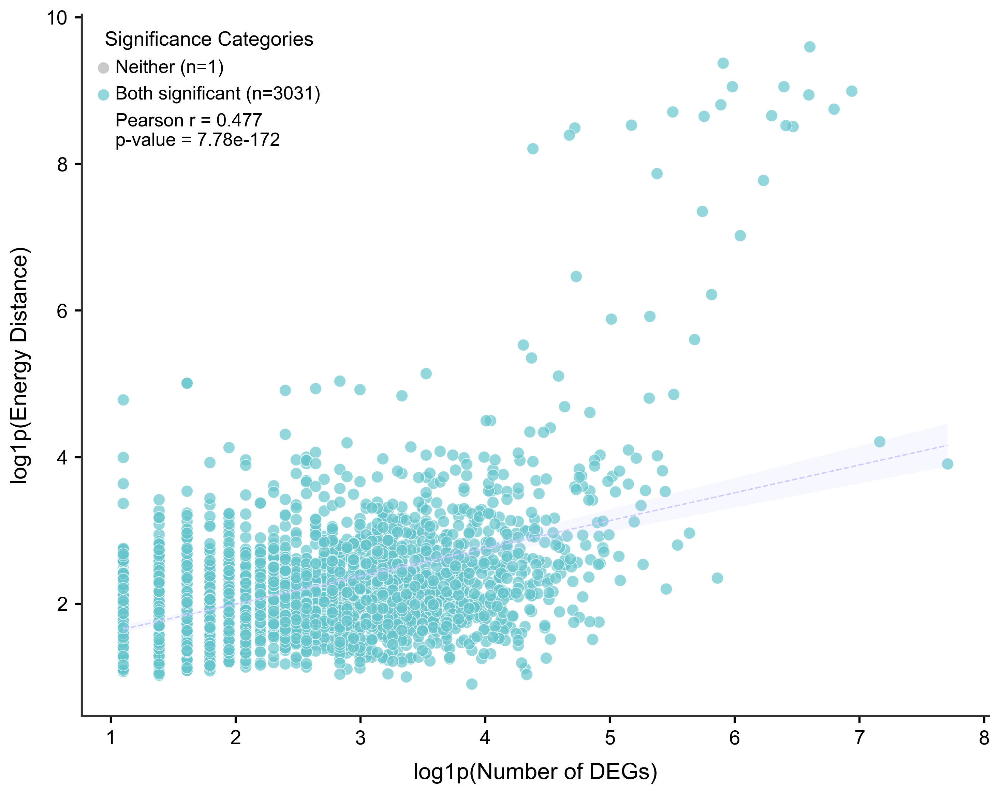

In [27]:
fig = psp.pl.plot_edist_vs_degs(filtered_adata)

In [28]:
num_1_sgRNA = sum(filtered_adata.obs.groupby('gene_target').gRNA.nunique() == 1)
num_2_sgRNA = sum(filtered_adata.obs.groupby('gene_target').gRNA.nunique() == 2)
num_3_sgRNA = sum(filtered_adata.obs.groupby('gene_target').gRNA.nunique() == 3)
print(f"{num_1_sgRNA} genes targeted have 1 sgRNA associated")
print(f"{num_2_sgRNA} genes targeted have 2 sgRNA associated")
print(f"{num_3_sgRNA} genes targeted have 3 sgRNA associated")

1789 genes targeted have 1 sgRNA associated
399 genes targeted have 2 sgRNA associated
148 genes targeted have 3 sgRNA associated


### Filtering for Coherent Perturbations

/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3579: DtypeWarning: Columns (3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114,117,120,123,126,129,132,135,138,141,144,147,150,153,156,159,162,165,168,171,174,177,180,183,186,189,192,195,198,201,204,207,210,213,216,219,222,225,228,231,234,237,240,243,246,249,252,255,258,261,264,267,270,273,276,279,282,285,288,291,294,297,300,303,306,309,312,315,318,321,324,327,330,333,336,339,342,345,348,351,354,357,360,363,366,369,372,375,378,381,384,387,390,393,396,399,402,405,408,411,414,417,420,423,426,429,432,435,438,441,444,447,450,453,456,459,462,465,468,471,474,477,480,483,486,489,492,495,498,501,504,507,510,513,516,519,522,525,528,531,534,537,540,543,546,549,552,555,558,561,564,567,570,573,576,579,582,585,588,591,594,597,600,603,606,609,612,615,618,621,624,627,630,633,636,639,642,645,648,651,654,657,660,663,666,66

Added 'coherent_target' column to adata.obs
- Cells with coherent targets: 41036/298440 cells (13.8%)
Perturbation coherence analysis:
- Total perturbations analyzed: 3031
- Total genes with multiple perturbations: 2336
- FDR threshold (at 95th percentile): 0.1429
- Perturbation pairs exceeding FDR: 390/843 (46.3%)
- Genes with coherent perturbations: 228/547 (41.7%)


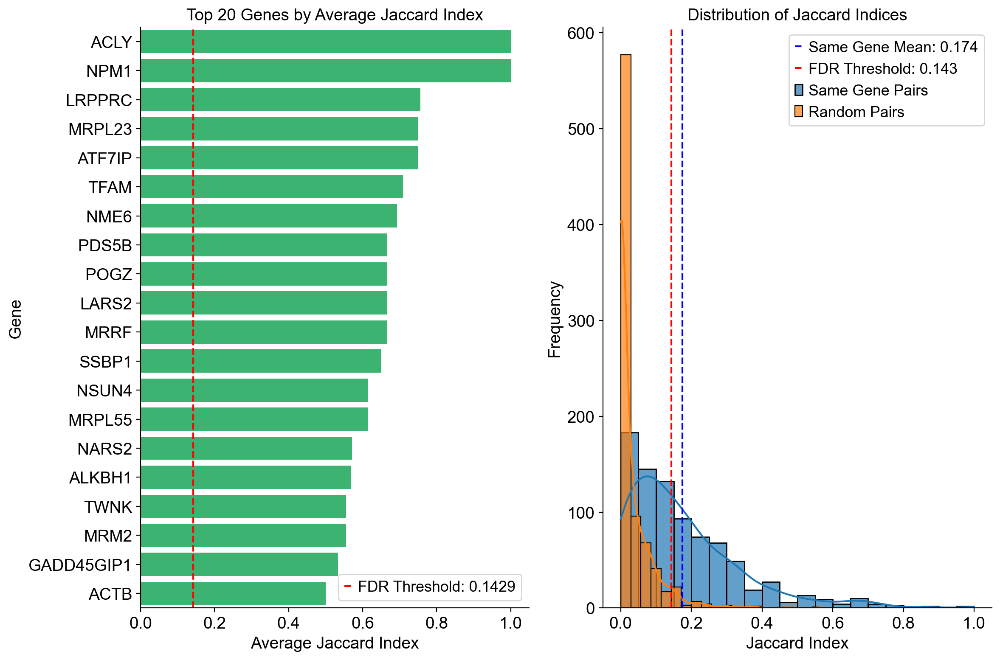

In [45]:
DEGs = '/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_DEG_per_perturbation.csv'
res = psp.da.analyze_perturbation_coherence(filtered_adata, DEGs, fdr_percentile=95, batch_mode = True)

In [57]:
def filter_to_coherent_perturbations(adata, coherent_target_column = 'coherent_target', NTC_column = 'perturbed'):
    coherent_cells = adata.obs[coherent_target_column] == True
    NTCs = adata.obs[NTC_column] == "False"
    valid_cells = coherent_cells | NTCs
    return adata[valid_cells].copy()

filtered_adata = filter_to_coherent_perturbations(filtered_adata)
filtered_adata.write('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Energy_Test_DEGs_FDR_Filtered_Coherent.h5ad')

/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
/tscc/nfs/home/ydoctor/miniconda3/envs/perturb_seq_env/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log10


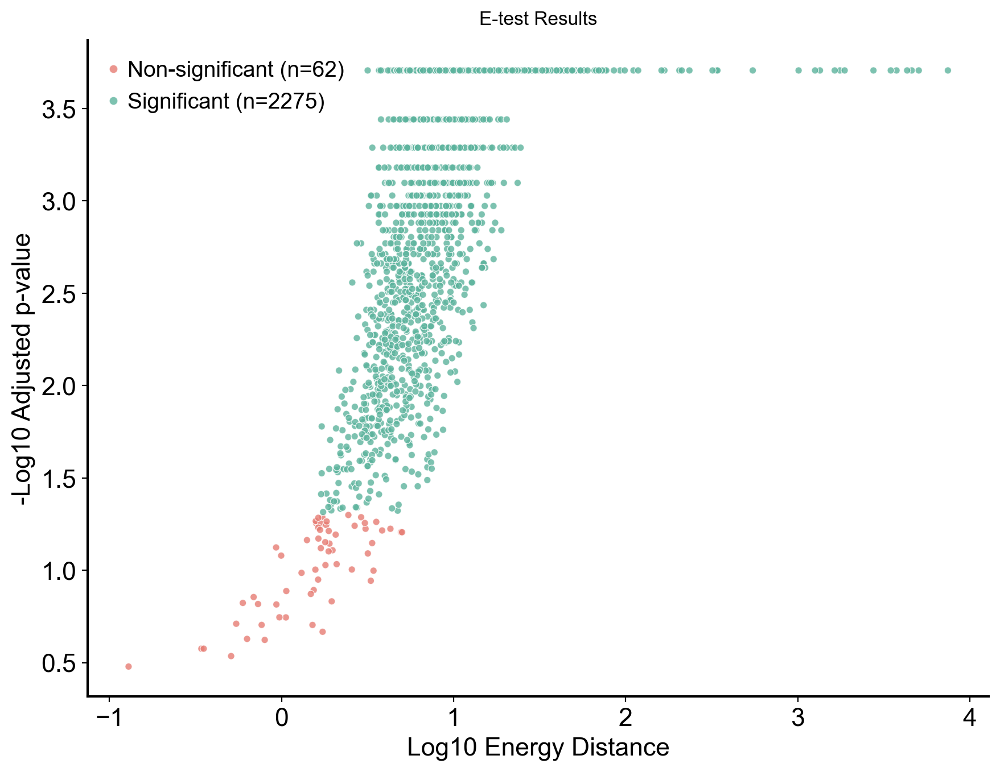

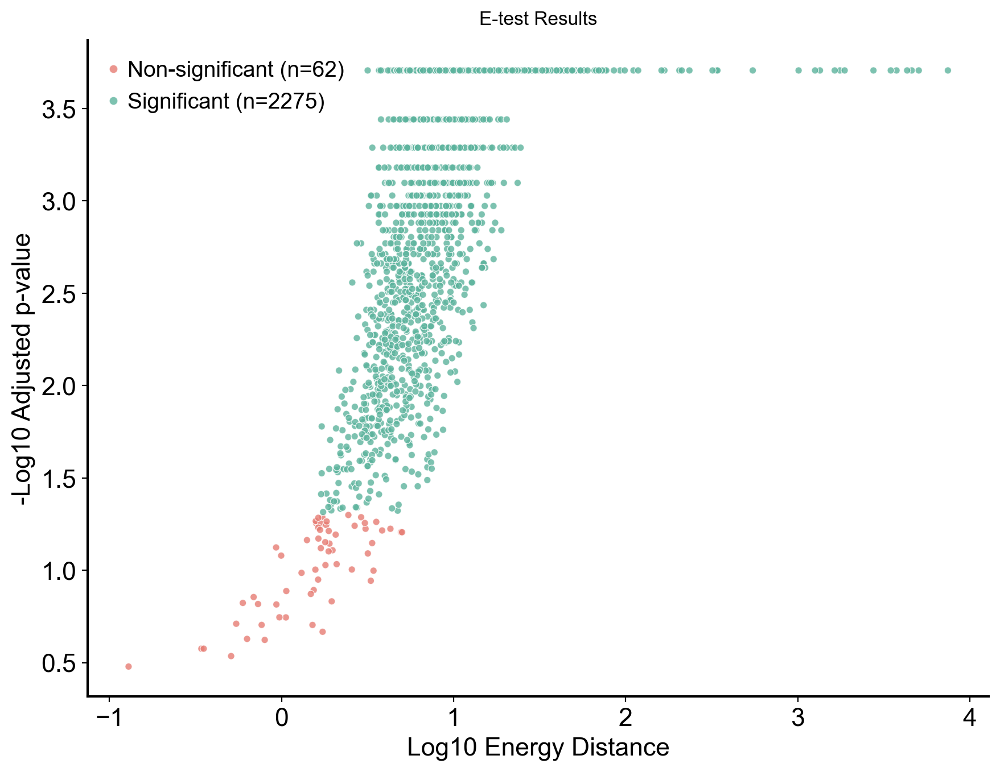

In [ ]:
import numpy as np
import pandas as pd
import scperturb as scp
import scanpy as sc
from tqdm import tqdm

from tqdm.auto import tqdm
from statsmodels.stats.multitest import multipletests
from sklearn.metrics import pairwise_distances
def etest_deterministic(adata, seed=42, obs_key='perturbation', control='NTC', 
                         obsm_key='X_pca', dist='sqeuclidean', n_jobs=-1, 
                         verbose=True, runs=10000, correction_method='fdr_bh', alpha=0.05):
    """
    A deterministic version of energy test that ensures the same set of permutations
    is used each time the function is called with the same seed.
    
    Parameters:
        adata: AnnData object
        seed: Random seed for reproducibility
        obs_key: Key in adata.obs for perturbation labels
        control: Label for control cells
        obsm_key: Key in adata.obsm for coordinates
        dist: Distance metric to use
        n_jobs: Number of jobs for parallelization
        verbose: Whether to show progress
        runs: Number of permutations
        correction_method: Method for multiple testing correction
        alpha: Significance threshold
        
    Returns:
        DataFrame with energy test results
    """
    groups = pd.unique(adata.obs[obs_key])
    control = [control] if isinstance(control, str) else control
    
    # Precompute pairwise distances
    pwds = {}
    for group in groups:
        x = adata[adata.obs[obs_key].isin([group] + control)].obsm[obsm_key].copy()
        pwd = pairwise_distances(x, x, metric=dist)
        pwds[group] = pwd
    
    # Set up deterministic permutation seeds
    master_rng = np.random.RandomState(seed)
    
    # Pre-generate all permutation seeds - this is the key to ensuring
    # the same set of permutations is used each time
    permutation_seeds = [master_rng.randint(0, 2**32) for _ in range(runs)]
    
    # Function to run a permutation with a specific seed
    def one_permutation(perm_seed):
        # Create a new RNG with this specific seed
        perm_rng = np.random.RandomState(perm_seed)
        
        df = pd.DataFrame(index=groups, columns=['edist'], dtype=float)
        M = np.sum(adata.obs[obs_key].isin(control))  # number of cells in control group
        
        for group in groups:
            if group in control:
                # Nothing to test here
                df.loc[group] = 0
                continue
                
            N = np.sum(adata.obs[obs_key]==group)
            
            # Get labels and shuffle them with this permutation's RNG
            labels = adata.obs[obs_key].values[adata.obs[obs_key].isin([group] + control)]
            shuffled_labels = perm_rng.permutation(labels)
            
            # Calculate energy distance using precomputed pairwise distances
            sc_pwd = pwds[group]
            idx = shuffled_labels==group
            
            # Calculate energy distance components
            factor = N / (N-1)  # sample_correct=True
            factor_c = M / (M-1)
            delta = np.sum(sc_pwd[idx, :][:, ~idx]) / (N * M)
            sigma = np.sum(sc_pwd[idx, :][:, idx]) / (N * N) * factor
            sigma_c = np.sum(sc_pwd[~idx, :][:, ~idx]) / (M * M) * factor_c
            
            edistance = 2 * delta - sigma - sigma_c
            df.loc[group] = edistance
            
        return df
    
    # Run the permutations in parallel, each with its pre-determined seed
    progress_func = tqdm if verbose else lambda x: x
    permutation_results = Parallel(n_jobs=n_jobs)(
        delayed(one_permutation)(seed) for seed in progress_func(permutation_seeds)
    )
    
    # Calculate the original (non-permuted) energy distances
    original_df = pd.DataFrame(index=groups, columns=['edist'], dtype=float)
    M = np.sum(adata.obs[obs_key].isin(control))
    
    for group in groups:
        if group in control:
            original_df.loc[group] = 0
            continue
            
        N = np.sum(adata.obs[obs_key]==group)
        
        # Get the original (non-shuffled) labels
        labels = adata.obs[obs_key].values[adata.obs[obs_key].isin([group] + control)]
        
        # Calculate energy distance
        sc_pwd = pwds[group]
        idx = labels==group
        
        factor = N / (N-1)
        factor_c = M / (M-1)
        delta = np.sum(sc_pwd[idx, :][:, ~idx]) / (N * M)
        sigma = np.sum(sc_pwd[idx, :][:, idx]) / (N * N) * factor
        sigma_c = np.sum(sc_pwd[~idx, :][:, ~idx]) / (M * M) * factor_c
        
        edistance = 2 * delta - sigma - sigma_c
        original_df.loc[group] = edistance
    
    # Count how many permutations had greater or equal energy distance
    # (indicates the permutation looks more extreme than the actual data)
    count_greater = np.zeros(len(groups), dtype=int)
    
    for i, group in enumerate(groups):
        for perm_result in permutation_results:
            if perm_result.loc[group, 'edist'] >= original_df.loc[group, 'edist']:
                count_greater[i] += 1
    
    # Calculate p-values
    pvalues = pd.Series(np.clip(count_greater, 1, np.inf) / runs, index=groups)
    
    # Apply multiple testing correction
    significant_adj, pvalue_adj, _, _ = multipletests(
        pvalues.values, alpha=alpha, method=correction_method
    )
    
    # Compile results into a DataFrame
    tab = pd.DataFrame({
        'edist': original_df['edist'],
        'pvalue': pvalues,
        'significant': pvalues < alpha,
        'pvalue_adj': pvalue_adj,
        'significant_adj': significant_adj
    }, index=groups)
    
    return tab

def compute_etest(adata, seed, num_ntc_cells=400, n_hvg=2000):
    np.random.seed(seed)
    # ad = scp.utils.equal_subsampling(adata, 'gene_target', n_sub)
    # Randomly subsample NTC cells to 3000
    control_label = 'NTC'
    control_mask = adata.obs['gene_target'] == control_label
    control_idx = np.where(control_mask)[0]
    if len(control_idx) > num_ntc_cells:
        sampled_control_idx = np.random.choice(control_idx, size=num_ntc_cells, replace=False)
    else:
        sampled_control_idx = control_idx
    non_control_idx = np.where(~control_mask)[0]
    subset_idx = np.concatenate([sampled_control_idx, non_control_idx])
    ad = adata[subset_idx].copy()
    sc.pp.highly_variable_genes(
        ad,
        n_top_genes=n_hvg,
        flavor='seurat_v3_paper',
        batch_key='batch',
        subset=True,
        layer='counts'
    )
    sc.pp.scale(ad)
    sc.pp.pca(ad, n_comps=50)
    sc.external.pp.harmony_integrate(ad, 'batch')
    edf = etest_deterministic(ad, seed=seed, obs_key='gene_target', control='NTC', obsm_key='X_pca_harmony', dist='sqeuclidean', n_jobs=-1, verbose=True, runs=10000, correction_method='fdr_bh', alpha=0.05)
    return edf
    
adata = psp.utils.read_anndata("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Energy_Test_DEGs_FDR_Filtered.h5ad")
adata.X = adata.layers['counts'].copy()
DEGs = pd.read_csv('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_DEGs_per_gene.csv') #Ran this at the gene level as well, see DEGs_Gene_Level.py
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)
adata_edist = adata.copy()
etest = compute_etest(adata_edist, seed=42)
etest['significant_adj'] = etest['significant_adj'].astype(str)
psp.pl.plot_etest_results(etest,significance_column='significant_adj', pvalue_column='pvalue_adj')

In [ ]:
DEGs_per_perturbation = dict()
for col in DEGs.columns:
    if '_DEG' in col:
        perturbation = col.split('_')[0]
        DEGs_per_perturbation[perturbation] = DEGs[col].count()
DEGs_per_perturbation = pd.DataFrame(DEGs_per_perturbation.items(), columns=['gene_target', 'n_DEGs'])
DEGs_per_perturbation.index = DEGs_per_perturbation['gene_target']
DEGs_per_perturbation.drop(columns=['gene_target'], inplace=True)
perturbation_stats = DEGs_per_perturbation.merge(etest, left_index=True, right_index=True, how='left')
perturbation_stats.to_csv("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Test_Gene_Level.csv")
# filter for perturbations with more than 1 DEG and positive edist
perturbation_stats_filtered = perturbation_stats[
    (perturbation_stats['n_DEGs'] > 1) &
    (perturbation_stats['significant_adj'] == 'True')
]
perturbation_stats_filtered.to_csv("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Test_DEGs_Per_Gene_Target_Filtered.csv")
perts = perturbation_stats_filtered.index.tolist() + ['NTC']
adata_filtered = adata[adata.obs['gene_target'].isin(perts)].copy()
adata_filtered.write_h5ad("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/KOLF_Pan_Genome_Energy_Test_Gene_Level_DEG_Etest_Filtered.h5ad")

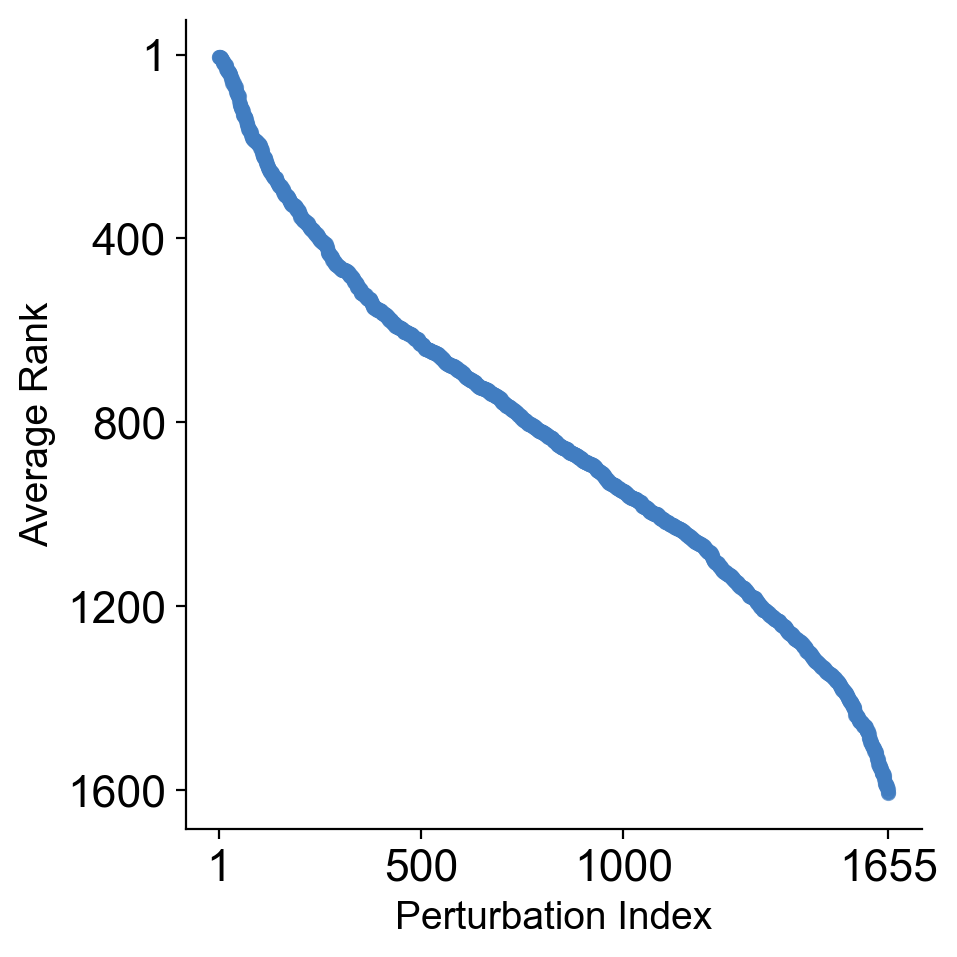

,gene_target,n_DEGs,edist,pvalue,significant,pvalue_adj,significant_adj,edist_rank,n_DEGs_rank,avg_rank
3,PTPN1,996,4323.801007,0.0001,True,0.000197,True,4.0,4.0,4.00
5,JOSD1,891,4599.262306,0.0001,True,0.000197,True,3.0,6.0,4.50
7,HRC,677,7460.292066,0.0001,True,0.000197,True,1.0,8.0,4.50
2,POU5F1,1580,2754.569034,0.0001,True,0.000197,True,7.0,3.0,5.00
6,ST13,748,3750.478853,0.0001,True,0.000197,True,5.0,7.0,6.00
11,PSMD8,557,5051.759535,0.0001,True,0.000197,True,2.0,12.0,7.00
4,POU5F1B,926,1756.988602,0.0001,True,0.000197,True,9.0,5.0,7.00
10,PHF20,594,1346.154576,0.0001,True,0.000197,True,11.0,11.0,11.00
8,TOMM40,632,341.439846,0.0001,True,0.000197,True,15.0,9.0,12.00
13,POU3F2,438,1011.737887,0.0001,True,0.000197,True,13.0,14.0,13.50


In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the data
data = pd.read_csv("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Test_DEGs_Per_Gene_Target_Filtered.csv")

# Create rankings for edist and n_DEGs
data['edist_rank'] = data['edist'].rank(ascending=False)  # Higher edist = better rank
data['n_DEGs_rank'] = data['n_DEGs'].rank(ascending=False)  # Higher n_DEGs = better rank

# Calculate average rank
data['avg_rank'] = (data['edist_rank'] + data['n_DEGs_rank']) / 2

# Sort by average rank (lowest to highest)
data_sorted = data.sort_values('avg_rank')

# Create the plot
fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(range(len(data_sorted)), data_sorted['avg_rank'], alpha=0.7, s=20, color='#417dc1')
ax.set_xlabel('Perturbation Index', fontsize=14)
ax.set_ylabel('Average Rank', fontsize=14)
ax.invert_yaxis()  # Invert y-axis so lower ranks (better) are at top

# Set x-axis ticks every 500 perturbations
n_perturbations = len(data_sorted)
xticks = [1, 500, 1000, n_perturbations]
ax.set_xticks([i-1 for i in xticks])
ax.set_xticklabels(xticks, fontsize=16)
yticks = [1, 400, 800, 1200, 1600]
ax.set_yticks([i-1 for i in yticks])
ax.set_yticklabels(yticks, fontsize=16)

# Only show x and y axis lines, not the full box
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.grid(False)

plt.tight_layout()
plt.savefig('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/Strong_Perturbation_Ranking.svg')
plt.show()

# Display the data sorted by average rank, showing top 25
data_sorted.head(30)

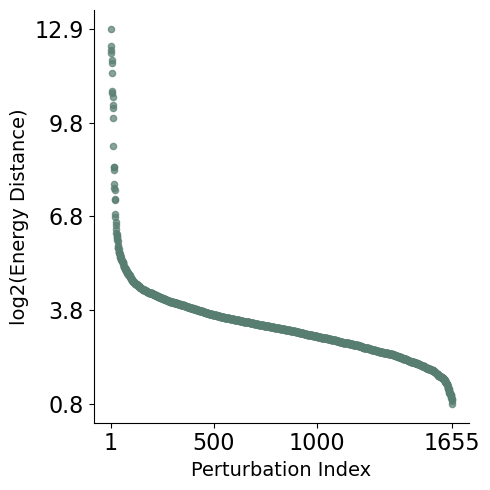

,gene_target,n_DEGs,edist,pvalue,significant,pvalue_adj,significant_adj,edist_log2
0,HRC,677,7460.292066,0.0001,True,0.000197,True,12.865016
1,PSMD8,557,5051.759535,0.0001,True,0.000197,True,12.302570
2,JOSD1,891,4599.262306,0.0001,True,0.000197,True,12.167187
3,PTPN1,996,4323.801007,0.0001,True,0.000197,True,12.078084
4,ST13,748,3750.478853,0.0001,True,0.000197,True,11.872859
5,MARVELD1,222,3473.186721,0.0001,True,0.000197,True,11.762044
6,POU5F1,1580,2754.569034,0.0001,True,0.000197,True,11.427611
7,IDI1,251,1873.620764,0.0001,True,0.000197,True,10.871613
8,POU5F1B,926,1756.988602,0.0001,True,0.000197,True,10.778889
9,RBM14,260,1640.539487,0.0001,True,0.000197,True,10.679955


In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the data
data = pd.read_csv("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Test_DEGs_Per_Gene_Target_Filtered.csv")

# Sort by edist (descending, so strongest perturbations are first)
data_sorted = data.sort_values('edist', ascending=False).reset_index(drop=True)

# Take log2 of edist for y-axis
data_sorted['edist_log2'] = np.log2(data_sorted['edist'])

# Create the plot: plot log2(edist) for each perturbation
fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(range(len(data_sorted)), data_sorted['edist_log2'], alpha=0.7, s=20, color='#587D71')
ax.set_xlabel('Perturbation Index', fontsize=14)
ax.set_ylabel('log2(Energy Distance)', fontsize=14)

# Set x-axis ticks every 500 perturbations
n_perturbations = len(data_sorted)
xticks = [1, 500, 1000, n_perturbations]
ax.set_xticks([i-1 for i in xticks])
ax.set_xticklabels(xticks, fontsize=16)

# Set y-ticks to a reasonable range based on the log2 data
ymin, ymax = data_sorted['edist_log2'].min(), data_sorted['edist_log2'].max()
yticks = np.linspace(ymin, ymax, num=5)
ax.set_yticks(yticks)
ax.set_yticklabels([f"{y:.1f}" for y in yticks], fontsize=16)

# Only show x and y axis lines, not the full box
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.grid(False)

plt.tight_layout()
plt.savefig('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/Strong_Perturbation_Edist_log2.svg')
plt.show()

# Display the data sorted by edist, showing top 30
data_sorted.head(30)

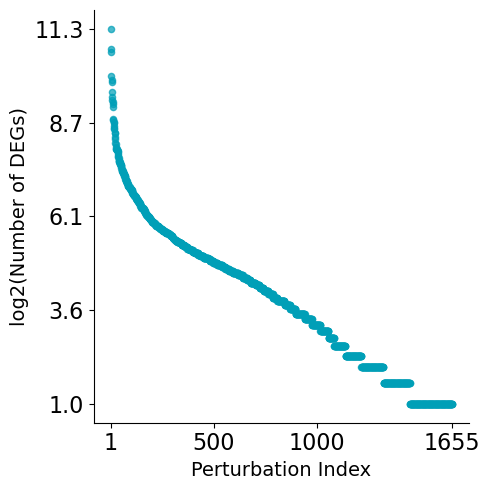

,gene_target,n_DEGs,edist,pvalue,significant,pvalue_adj,significant_adj,n_DEGs_log2
0,MYADM,2463,50.737982,0.0001,True,0.000197,True,11.266201
1,DBR1,1690,27.646516,0.0001,True,0.000197,True,10.722808
2,POU5F1,1580,2754.569034,0.0001,True,0.000197,True,10.625709
3,PTPN1,996,4323.801007,0.0001,True,0.000197,True,9.960002
4,POU5F1B,926,1756.988602,0.0001,True,0.000197,True,9.854868
5,JOSD1,891,4599.262306,0.0001,True,0.000197,True,9.799282
6,ST13,748,3750.478853,0.0001,True,0.000197,True,9.546894
7,HRC,677,7460.292066,0.0001,True,0.000197,True,9.403012
8,TOMM40,632,341.439846,0.0001,True,0.000197,True,9.303781
9,KAT2A,609,15.630000,0.0001,True,0.000197,True,9.250298


In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Read the data
data = pd.read_csv("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Test_DEGs_Per_Gene_Target_Filtered.csv")

# Sort by n_DEGs (descending, so strongest perturbations are first)
data_sorted = data.sort_values('n_DEGs', ascending=False).reset_index(drop=True)

# Take log2 of n_DEGs for y-axis
data_sorted['n_DEGs_log2'] = np.log2(data_sorted['n_DEGs'].replace(0, np.nan))

# Create the plot: plot log2(n_DEGs) for each perturbation
fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(range(len(data_sorted)), data_sorted['n_DEGs_log2'], alpha=0.7, s=20, color='#009FB7')
ax.set_xlabel('Perturbation Index', fontsize=14)
ax.set_ylabel('log2(Number of DEGs)', fontsize=14)

# Set x-axis ticks every 500 perturbations
n_perturbations = len(data_sorted)
xticks = [1, 500, 1000, n_perturbations]
ax.set_xticks([i-1 for i in xticks])
ax.set_xticklabels(xticks, fontsize=16)

# Set y-ticks to a reasonable range based on the log2 data
ymin, ymax = data_sorted['n_DEGs_log2'].min(), data_sorted['n_DEGs_log2'].max()
yticks = np.linspace(ymin, ymax, num=5)
ax.set_yticks(yticks)
ax.set_yticklabels([f"{y:.1f}" for y in yticks], fontsize=16)

# Only show x and y axis lines, not the full box
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)
plt.grid(False)

plt.tight_layout()
plt.savefig('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/Strong_Perturbation_nDEGs_log2.svg')
plt.show()

# Display the data sorted by n_DEGs, showing top 30
data_sorted.head(30)

Regression results:
  slope = 0.571
  intercept = 1.895
  r^2 = 0.130
  p-value = 5.867e-52


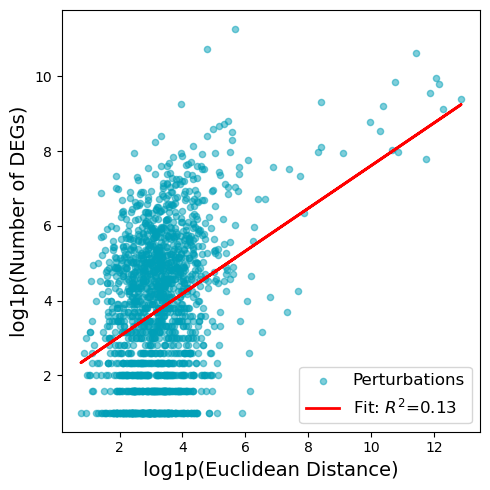

In [27]:
from scipy.stats import linregress

# Regress log1p(n_DEGs) vs log1p(edist)
x = np.log2(data_sorted['edist'])
y = np.log2(data_sorted['n_DEGs'])

slope, intercept, r_value, p_value, std_err = linregress(x, y)

print(f"Regression results:")
print(f"  slope = {slope:.3f}")
print(f"  intercept = {intercept:.3f}")
print(f"  r^2 = {r_value**2:.3f}")
print(f"  p-value = {p_value:.3e}")

# Plot regression
fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(x, y, alpha=0.5, s=20, color='#009FB7', label='Perturbations')
ax.plot(x, intercept + slope * x, color='red', lw=2, label=f'Fit: $R^2$={r_value**2:.2f}')
ax.set_xlabel('log1p(Euclidean Distance)', fontsize=14)
ax.set_ylabel('log1p(Number of DEGs)', fontsize=14)
ax.legend(fontsize=12)
plt.tight_layout()
plt.show()


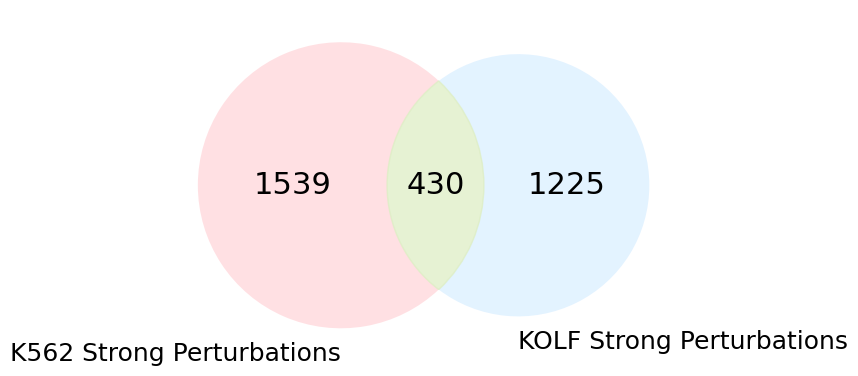

K562 strong perturbations: 1969
KOLF strong perturbations: 1655
Overlap: 430
K562 only: 1539
KOLF only: 1225
Overlap percentage (of K562): 21.8%
Overlap percentage (of KOLF): 26.0%


In [34]:
import pandas as pd
import matplotlib.pyplot as plt

k562_perturbations = set(pd.read_csv('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/k562_strong_perturbations.txt', header=None).iloc[:,0].tolist())
kolf_perturbations = set(pd.read_csv('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/KOLF_Pan_Genome_Energy_Test_DEGs_Per_Gene_Target_Filtered.csv', index_col='gene_target').index.tolist())

# Create Venn diagram
from matplotlib_venn import venn2

# Create the Venn diagram with custom colors
fig, ax = plt.subplots(figsize=(8, 6))
venn = venn2([k562_perturbations, kolf_perturbations], 
      set_labels=('K562 Strong Perturbations', 'KOLF Strong Perturbations'),
      ax=ax,
      set_colors=('#ffb3ba','#bae1ff'))

# Set the overlap color to '#dcedc1'
if venn.get_patch_by_id('11') is not None:
    venn.get_patch_by_id('11').set_color('#dcedc1')
    venn.get_patch_by_id('11').set_alpha(0.7)

# Make the labels inside the Venn diagram larger
for label in ['10', '01', '11']:
    text = venn.get_label_by_id(label)
    if text is not None:
        text.set_fontsize(22)  # Increase font size for region labels

# Also increase the set label font size
for label in venn.set_labels:
    if label is not None:
        label.set_fontsize(18)

plt.tight_layout()

# Save the plot
plt.savefig('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/K562_KOLF_Perturbation_Overlap.svg')
plt.show()

# Print statistics
intersection = k562_perturbations & kolf_perturbations
k562_only = k562_perturbations - kolf_perturbations
kolf_only = kolf_perturbations - k562_perturbations

print(f"K562 strong perturbations: {len(k562_perturbations)}")
print(f"KOLF strong perturbations: {len(kolf_perturbations)}")
print(f"Overlap: {len(intersection)}")
print(f"K562 only: {len(k562_only)}")
print(f"KOLF only: {len(kolf_only)}")
print(f"Overlap percentage (of K562): {len(intersection)/len(k562_perturbations)*100:.1f}%")
print(f"Overlap percentage (of KOLF): {len(intersection)/len(kolf_perturbations)*100:.1f}%")

In [35]:
for gene in intersection:
    print(gene, end=',')

CLNS1A,ZNF292,EIF4G1,HUWE1,PRMT5,ZNF787,NIPBL,CNOT11,NELFCD,MRPS14,COX6B1,CCNC,NGRN,UXT,MTRES1,FBXL14,MRPL43,SETDB1,CNOT10,THRAP3,NDUFB9,ADSL,DROSHA,ATP5PO,HCCS,CCNK,CCNQ,RPL22L1,HNRNPA1,ADNP2,CMTR2,C5orf22,CDK13,MRPL35,AMMECR1,NAE1,NAA15,SETD2,MRPS2,ARIH1,NDUFV2,SP1,STAG2,SUPV3L1,TRMT10C,NSUN4,COX11,SMARCC1,TOP1,C1QBP,UQCRQ,ROMO1,GEMIN4,LARS2,CUL1,LUC7L2,NARS2,PTEN,NUP43,GTF2A1,FASTKD5,SCAF4,METTL3,DOHH,CRAT,MRPL16,ICE1,UBE2I,NUDCD1,DNMT1,CDC14B,CNOT2,WDR26,ZNF219,PTPN1,STARD7,COX15,RANBP3,UGCG,MRPL42,NDUFB8,CLASRP,EIF4E,CNOT3,SHC1,ATRX,NAA20,PAXBP1,RBM42,HNRNPM,LRPPRC,MRPL28,KDM1A,ZC3H18,MRPL52,MRPL3,NDUFB10,ZNF358,RHEB,COX7C,SNAPC1,ZC3H3,MRPL14,TIMM17B,MED22,MRPL38,VPS39,TAF6,ATIC,PSME1,CAMLG,SRSF10,UBA6,MED16,ATP6AP1,UBA5,PCID2,ZNF324,MRPL39,MRPL27,MRPS15,URI1,IWS1,GRSF1,RBFA,SRSF11,MED1,CCDC6,GLRX5,MRPL10,INTS10,UQCRFS1,MUTYH,ERAL1,REST,PFN1,MRPS17,TMEM259,QRSL1,MRPL23,TOE1,DR1,NELFE,UBA2,MRPL24,PNPT1,TMED2,TMED4,MRPL37,UQCRB,CABIN1,ATP8B2,SKIL,TOR1B,RBM7,EIF4G2,STRAP,ZC3H13,DNM1L

In [36]:
for gene in k562_only:
    print(gene, end=',')

RAD51C,DERL2,GBA2,DAD1,MBIP,MAGOH,SLC1A5,HSD17B12,UNCX,TNPO1,LSM2,THOC7,SLC2A11,PXN,SPATA5L1,PRDM8,HARS,WDR46,HBS1L,AAMP,PPIE,EMC7,OPA1,INTS3,CSE1L,RASSF1,TTK,MED8,PRPF39,POLR2I,ITPK1,RPL17,TBP,PGD,ATP6V1G1,RPL32,NFIC,TLE3,NUB1,RPS13,CCNL1,NOL11,LZTR1,PRPF8,VMP1,TSR2,RIC8A,DUT,UMPS,FAM32A,SETX,RIF1,ZNF786,PSMC3,ITGB1BP1,NAA10,RANGAP1,MGAT4B,HSPD1,IARS,SH3GLB2,VPS4A,FARSA,DDX27,INPPL1,TRMT5,EXOSC3,TIMM13,TRIAP1,HSPA5,CENPC,MCTS1,HMX3,GRPEL1,SERINC3,TADA3,ST20-MTHFS,TOM1L1,ELP4,BHLHE40,TAF1C,RPL38,NOP14,SS18L2,SLC35F6,SOD2,TPP2,BRD2,HOXA3,TTF1,C16orf72,CIAO1,NRF1,CHCHD4,SPHK2,ETF1,TRIM24,ELAVL1,FNBP4,MED21,ZNF236,ZNF706,GOLT1B,NXT1,POLR2B,RPS19,INTS8,DHX37,TUT1,PSMB1,MGRN1,ATP5MPL,TBX1,MBTPS2,DHPS,CINP,KLHL12,HMBOX1,DPY19L4,TMSB10,VPS28,STK24,TMEM161B,MTHFD1,DNTTIP2,PES1,ZNF281,RPL18A,COPS4,MPG,RIOK2,ZCCHC9,MAPKAP1,EXOC4,NR2E1,NUP133,KCMF1,RMI1,INTS11,BYSL,DHX9,POLG2,POP7,RPS3,TAF5,RIOK1,SRFBP1,SLC35A3,RBBP4,CASP8AP2,C5orf30,RPS5,POLR2C,PRMT1,MSL3,ATAD5,HEBP1,DDX3X,NOLC1,COPS8,ATP6V1A,PA

In [37]:
for gene in kolf_only:
    print(gene, end=',')

MEPCE,ECSIT,INO80E,CEP76,SNRPB,CNPY3,KIAA0232,MTERF4,HDAC3,TMEM37,SPTAN1,PABPC1,ARID1A,SUZ12,EYA3,NEK4,PYM1,FKBP2,ATP5MC1,HEY2,CYTH2,GRIK5,FAAP20,GOLGA4,MLST8,ACOT8,ACSF3,SAMD10,UBE2J1,HS2ST1,SIGMAR1,KMT2D,CLDN9,PIN1,ATOX1,NASP,CCN2,GATA5,TASOR,ADAMTS13,RIMS3,COQ3,DUSP5,INTS15,RASL12,STXBP1,IVNS1ABP,ULK1,BAK1,YWHAH,PPIL1,MRPL49,GNG12,PLCXD1,MORC2,ARHGEF16,PAXX,ICE2,ALKBH1,SUPT7L,POM121,ETV1,CCDC160,GMCL1,TMEM47,LYSMD1,ATG4B,GPR37,CYB5RL,CD24,PDCD6,SLC25A3,CTNNBIP1,METTL22,FAM117A,SYNGR1,SLC25A5,DPP3,SEPTIN3,USP35,PSKH1,ECSCR,ITPA,NDUFS6,VPS37C,OTUD6B,PCLAF,DPY30,KDM2A,UGDH,CA11,ATM,BSG,TAF4,GIT1,REEP4,TMEM86B,ACOT13,CAND1,RESF1,BOD1,METRN,SERINC5,DSG2,PTGES3,PTBP3,MAP4K4,TBC1D13,GTF2I,TCEAL2,PCDH8,NCS1,CGREF1,HNRNPUL1,CARS2,FXYD6,TOMM34,IKZF5,SLC50A1,SH3BGRL3,CTDNEP1,C4orf48,MCAT,ATP5MC3,COL2A1,SOX11,PLIN3,UBE2M,ASPM,RCOR2,AMH,KDM5A,MYEF2,KLF1,C7orf25,SRSF6,RLIM,ZDHHC22,NSMCE4A,NAXD,GRPEL2,IRX5,TGFBR1,ZNF275,SLC4A1AP,PPP1R3D,TAF5L,PRDX1,YIPF5,PRKDC,VAMP3,S100PBP,INPP5F,EIF3K,CRY2,B4GAL

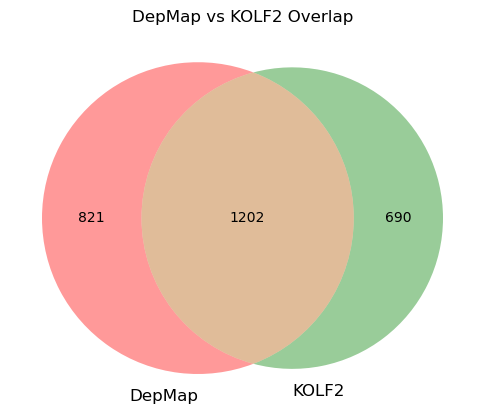

DepMap only:
ACIN1,ACO2,ACTB,ACTG1,ADAR,ADSL,ADSS2,AFG3L2,AGAP5,AGAP6,AHCY,AK6,AKIRIN2,ALDOA,ALDOC,ALG10B,ALG13,ALG14,ALYREF,AMY2A,ANAPC10,ANAPC11,ANKRD18B,ANKRD35,AP2M1,AQP7,ARF4,ARFRP1,ARHGEF5,ARIH1,ARPC2,ARPP19,ASDURF,ATP1A1,ATP23,ATP5MC2,ATP6AP2,ATP6V0B,ATP6V0C,ATP6V1G1,ATP6V1H,ATR,AURKA,AURKAIP1,AURKB,BANF1,BARD1,BCCIP,BCLAF1,BMF,BPTF,BRD4,BRD8,BTF3L4,BUD31,BYSL,C17orf49,C17orf58,C19orf53,C1orf109,C2orf81,C2orf92,C3orf49,CA5A,CACNB3,CAMLG,CAPZB,CCAR1,CCDC107,CCDC115,CCDC163,CCDC196,CCDC43,CCDC57,CCNB1IP1,CCNL1,CCNQ,CD24,CD300H,CDC14C,CDC16,CDCA5,CDK2,CDK4,CDK5RAP3,CEBPZOS,CECR2,CELSR2,CENPT,CEP131,CFAP298,CFAP54,CFAP97D2,CFL1,CHAF1A,CHCHD1,CHCHD2,CHCHD3,CHD4,CHEK1,CHKA,CHMP3,CHMP4B,CHMP7,CIAO1,CIR1,CIT,CITED4,CKS1B,CLASP1,CLASP2,CLCC1,CLK2,CLP1,CMPK1,CNOT2,COA5,COG1,COG2,COG6,COIL,COPB2,COPE,COPG1,COPG2,COPS2,COPS3,COPS8,COPZ2,COX11,COX17,COX20,COX5A,COX6A1,COX6B1,COX7B,CPSF2,CRCT1,CRLS1,CRYBG3,CSAG2,CSH2,CSNK1A1,CSNK2B,CSNKA2IP,CTAGE9,CTCF,CTDNEP1,CTPS1,CTU2,CUL3,CWC22,CWF19L2,CY

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

# Load data
data = pd.read_csv('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/DepmapVSKOLF2-2025.csv')
depmap_set = set(data['Depmap'].dropna())
kolf_set = set(data['KOLF2'].dropna())

# Venn diagram
plt.figure(figsize=(6,6))
venn2([depmap_set, kolf_set], set_labels=('DepMap', 'KOLF2'))
plt.title('DepMap vs KOLF2 Overlap')
plt.show()

# Calculate sets
depmap_only = depmap_set - kolf_set
overlap = depmap_set & kolf_set

# Print comma-separated lists
print("DepMap only:")
print(",".join(sorted(depmap_only)))
print("\nOverlap:")
print(",".join(sorted(overlap)))

In [3]:
import anndata as ad
adata = psp.utils.read_anndata("/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/input_files/anndata_objects/KOLF_Pan_Genome_Knockdown_Filtered.h5ad")

In [4]:
import scanpy as sc
adata.X = adata.layers["counts"]
sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)
genes_of_interest = ["POU5F1","SOX2","KLF4","MYC", "NANOG","LIN28A","LIN28B","SALL4","ESRRB","PRDM14","TCF3","TBX3", "ZNF521", "PTPN1", "PHF20"]
adata = adata[:, adata.var_names.isin(genes_of_interest)].copy()
psp.da.relative_z_normalization_df(adata, batch_key='batch')
bulks = psp.da.bulk_by_gene_target_mean(adata)

normalizing counts per cell
    finished (0:00:19)


In [5]:
bulks

gene_target,A1CF,A4GALT,AAAS,AACS,AAGAB,AAMP,AAR2,AARD,AARS2,AASDH,...,ZSWIM7,ZSWIM8,ZSWIM9,ZUP1,ZW10,ZXDB,ZXDC,ZYG11B,ZYX,ZZZ3
LIN28A,0.006711,0.171470,0.002310,-0.086879,0.210774,0.029225,0.122847,0.033420,-0.070920,-0.017664,...,-0.128346,0.013365,-0.061794,0.029393,-0.056871,0.021341,0.074245,0.034762,-0.094378,0.080939
SOX2,0.071982,0.112347,0.029448,0.092899,0.079320,0.140576,0.094869,0.098918,0.066542,-0.144662,...,0.007814,0.067643,0.184771,0.037327,0.058454,0.016606,0.124890,-0.000929,0.155487,0.041423
POU5F1,0.115284,0.092873,0.008108,0.083961,-0.059628,0.053665,-0.075997,0.070380,-0.039959,-0.073223,...,0.052426,0.074197,0.105427,0.121205,0.023326,-0.019683,0.131041,-0.022178,-0.017196,-0.050020
LIN28B,0.114377,0.084147,0.106724,0.134894,0.070894,0.107702,0.148902,0.041209,0.019705,0.056337,...,0.110591,0.075985,0.028143,0.047015,0.083070,0.023563,0.238469,0.019948,0.027157,0.037841
PRDM14,0.069781,0.016097,0.017453,-0.034981,0.060051,-0.133796,0.061882,0.055556,-0.030661,0.060538,...,-0.025302,-0.076618,0.041818,-0.025439,0.164234,-0.074676,0.094822,0.099669,-0.037577,-0.047246
MYC,0.057005,0.075017,0.045095,-0.006795,0.122217,0.209029,0.025015,-0.001854,-0.041610,0.044278,...,0.022387,0.146268,0.166163,-0.118132,0.088414,0.026383,0.062376,0.019280,-0.013285,-0.042976
KLF4,-0.017749,0.042749,0.074309,0.045759,0.083055,-0.045760,-0.045760,-0.045760,-0.053784,-0.012239,...,-0.045760,-0.045760,0.003726,0.013241,-0.053784,-0.020383,-0.053784,-0.019980,-0.006823,0.018807
NANOG,0.138107,0.062533,-0.001404,0.066544,0.012257,-0.019881,-0.105903,0.044077,0.066886,-0.079139,...,-0.115855,-0.115222,-0.033061,0.044820,-0.018453,0.067593,0.021457,0.151961,0.097539,0.031014
TBX3,-0.019018,-0.025339,-0.025339,-0.019018,-0.029361,-0.025339,-0.025339,-0.025339,-0.019018,-0.019018,...,-0.025339,-0.025339,0.024047,-0.019018,-0.019018,-0.019018,-0.019018,-0.029361,-0.025339,-0.019018
ESRRB,-0.013415,0.031153,0.036035,-0.053424,-0.120207,0.171718,0.151555,0.028842,0.044952,0.008187,...,0.044775,0.039075,-0.060376,0.023264,0.031506,0.032096,0.029059,0.010804,0.089214,0.018397


In [6]:
len(genes_of_interest)

15

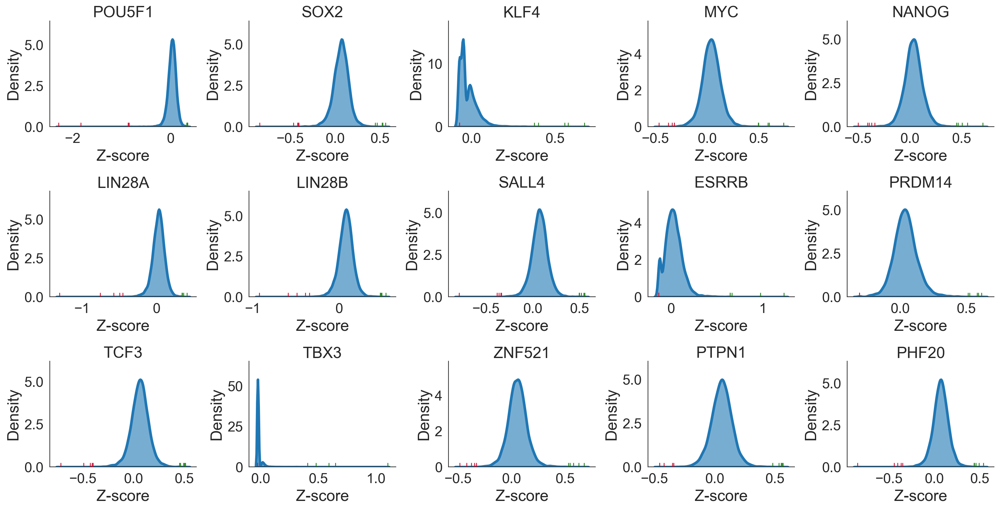


POU5F1:
  Top 5: ERCC3, TOMM40, TSACC, NDUFB6, MAP3K20
  Bottom 5: POU5F1, RBM14, PHF20, SEC63, MARVELD1

SOX2:
  Top 5: TRAPPC1, MARCHF6, TADA2A, EMC1, ZC3H11C
  Bottom 5: SOX2, KIF20B, SMC1B, ARSK, SKIC8

KLF4:
  Top 5: CEP152, VCL, COPS8, ANKLE2, PPP6R3
  Bottom 5: ACBD5, C15orf62, CD177, CEL, CNST

MYC:
  Top 5: CETN2, TELO2, ING3, UBA2, ZRANB1
  Bottom 5: MYC, DSN1, POU5F1, FAM177A1, KIF20B

NANOG:
  Top 5: MRPL46, TOMM40, VCL, DISP3, CD37
  Bottom 5: NANOG, SKIC8, PCNX1, RRP36, ELP4

LIN28A:
  Top 5: TSACC, MED22, CHTF18, PPP1R1B, MOSPD2
  Bottom 5: LIN28A, NEDD8, PFN1, TRAPPC1, TOR1AIP2

LIN28B:
  Top 5: MKRN1, POU5F1, SEPTIN7, GTF2A2, TRAPPC3
  Bottom 5: LIN28B, ARIH2, OPA1, TELO2, LY6G5B

SALL4:
  Top 5: NANOGP8, JAK3, CCNB1, PPP2R2A, CNKSR1
  Bottom 5: SALL4, INTS1, MYO9B, HJURP, TMEM106A

ESRRB:
  Top 5: STON2, EHMT2, MTX1, CD2AP, SOGA1
  Bottom 5: ABHD15, ADAM10, AKT1, ALDOA, ANKLE2

PRDM14:
  Top 5: ARFGAP2, VPS18, PABPN1, ATXN7L2, HEXIM2
  Bottom 5: HAUS8, MYO9B, PCNP, R

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

# Clean, grid-free style
sns.set_style("white")
plt.rcParams["axes.grid"] = False

# Use the original genes_of_interest order, but only those present in bulks
genes = [g for g in genes_of_interest if g in bulks.index][:15]

# Store top/bottom 5 identities for each gene
top_bottom_dict = {}

# Figure setup: 2 rows × 6 cols
n_rows, n_cols = 3, 5
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 9), sharey=False)
axes = axes.flatten()

# Define new colors: crimson for bottom, forestgreen for top
bottom_color = 'crimson'
top_color = 'forestgreen'

for ax, gene in zip(axes, genes):
    # Long form
    df_long = (
        bulks
        .loc[[gene]]
        .melt(var_name='perturbation', value_name='score')
    )
    # Find bottom/top
    bottom5 = df_long.nsmallest(5, 'score')
    top5    = df_long.nlargest(5, 'score')

    # Save for later printing
    top_bottom_dict[gene] = {
        "top5": top5['perturbation'].tolist(),
        "bottom5": bottom5['perturbation'].tolist()
    }

    # KDE
    sns.kdeplot(
        data=df_long,
        x='score',
        fill=True,
        alpha=0.6,
        ax=ax,
        linewidth=3
    )

    # Colored rugs at the bottom
    sns.rugplot(x=bottom5['score'], ax=ax, color=bottom_color, height=0.04, linewidth=1)
    sns.rugplot(x=top5['score'],    ax=ax, color=top_color,    height=0.04, linewidth=1)

    # Only gene name in the title
    ax.set_title(f"{gene}", fontsize=18, pad=4, loc='center')

    # Aesthetics
    ax.set_xlabel('', fontsize=18)
    ax.set_ylabel('Density', fontsize=18)
    ax.set_xlabel('Z-score', fontsize=18)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)
    sns.despine(ax=ax)

# Hide unused panels
for ax in axes[len(genes):]:
    ax.set_visible(False)

# Shared legend
legend_elems = [
    Line2D([0], [0], color=top_color, lw=3, label='Top 5'),
    Line2D([0], [0], color=bottom_color, lw=3, label='Bottom 5')
]

plt.tight_layout(rect=[0,0,1,0.93])
plt.savefig('/tscc/projects/ps-malilab/ydoctor/KOLF_Perturbation_Atlas/KOLF_Perturbation_Atlas_Analysis/output_files/Pluripotency_Z_Scores.svg', dpi=300, bbox_inches='tight')
plt.show()

# Print top/bottom 5 identities for each gene after the plot
for gene in genes:
    print(f"\n{gene}:")
    print("  Top 5:", ", ".join(top_bottom_dict[gene]["top5"]))
    print("  Bottom 5:", ", ".join(top_bottom_dict[gene]["bottom5"]))
